# ECE 228 Unet (ISBI 2013 dataset)

# Python imports

In [1]:
import numpy as np
import os
import sys
from matplotlib import pyplot as plt
%matplotlib inline  

import torch
from torch import nn
from torch.autograd import Variable
from torchvision import transforms, utils
from skimage import io, transform
from skimage.color import rgb2gray

from models import * 
from train import *
from data_loader import * 

from scipy import ndimage

from matplotlib.colors import ListedColormap


# Load data

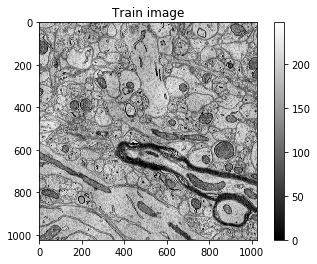

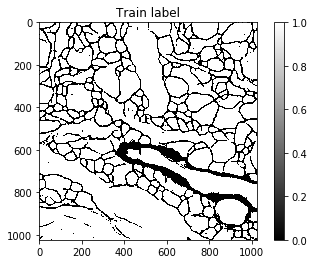

max =  1
min =  0
train_imgs shape =  (100, 1, 1024, 1024)
train_labels shape =  (100, 1, 1024, 1024)


In [18]:
from PIL import Image

resize_size = 512

data_tif = Image.open('datasets/isbi_2013/train-input_snemi3d.tif')
train_imgs = []
i = 0
while True:
    try:
        data_tif.seek(i)
        train_imgs.append(np.array(data_tif))
        #train_imgs.append(transform.resize(np.array(data_tif),(resize_size,resize_size)))

        i += 1
    except EOFError:
        # Not enough frames in img
        break
        
train_imgs = np.array(train_imgs)
train_imgs = np.expand_dims(train_imgs, axis=1)


label_tif = Image.open('datasets/isbi_2013/train-membranes-idsia_snemi3d.tif')
train_labels = []
i = 0
while True:
    try:
        label_tif.seek(i)
        train_labels.append(np.array(label_tif))
        #train_labels.append(transform.resize(np.array(label_tif),(resize_size, resize_size)))

        i += 1
    except EOFError:
        # Not enough frames in img
        break
        
train_labels = np.array(train_labels)
train_labels = np.expand_dims(train_labels, axis=1)

train_labels = (train_labels > 180).astype(np.uint8)

plt.imshow(np.squeeze(train_imgs[0]),cmap="gray")
plt.title("Train image")
plt.colorbar()
plt.show()

plt.imshow(np.squeeze(train_labels[0]), cmap="gray")
plt.title("Train label")
plt.colorbar()
plt.show()


print("max = ",np.max(train_labels))
print("min = ",np.min(train_labels))
#train_imgs = (train_imgs/127)-1
#train_labels = (train_labels/255)






print("train_imgs shape = ",train_imgs.shape)
print("train_labels shape = ",train_labels.shape)






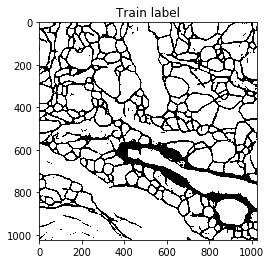

In [3]:
plt.imshow(np.squeeze(train_labels[0] ), cmap="gray")
plt.title("Train label")
#plt.colorbar()
plt.show()

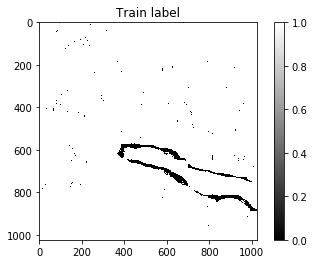

In [13]:
plt.imshow((np.squeeze(train_labels[0])>0.95).astype(np.uint8), cmap="gray")
plt.title("Train label")
plt.colorbar()
plt.show()

# Run Training

GPU is enabled 
80/20 training/validation split
total_train_size =  100
val_size =  20
y train shape =  (80, 1024, 1024)
y train shape =  (20, 1024, 1024)
training image from batch 0


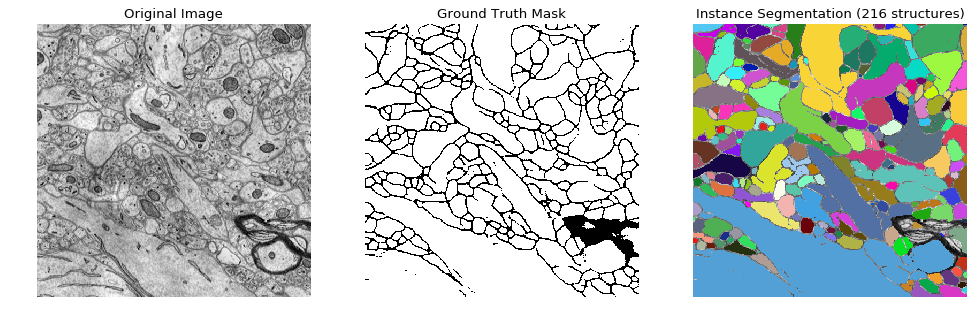

training image from batch 1


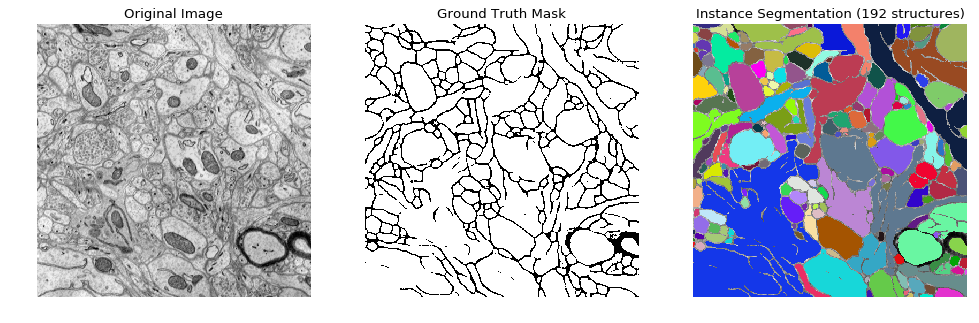

training image from batch 2


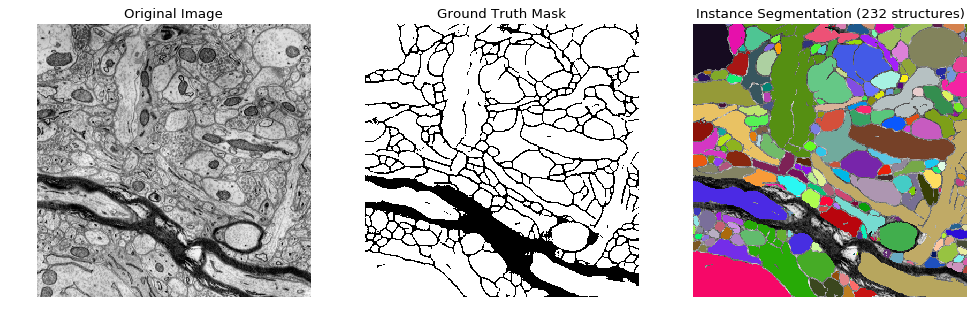

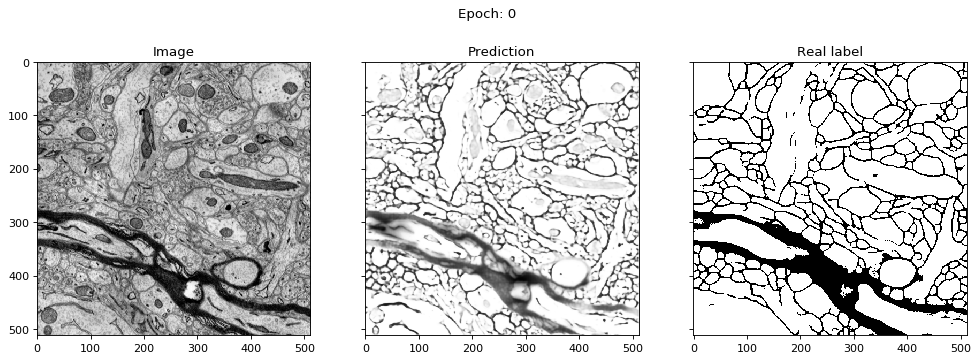

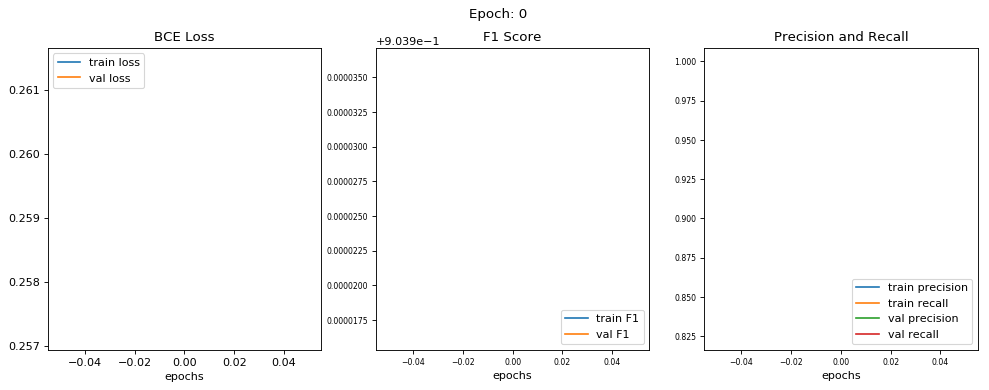

epoch [0/100] 
train loss = 0.2572, train f1 score = 0.9039 
train precision = 0.8251, train recall = 0.9999 

val loss = 0.2614, val f1 score = 0.9039 
val precision = 0.8252, val recall = 0.9998 




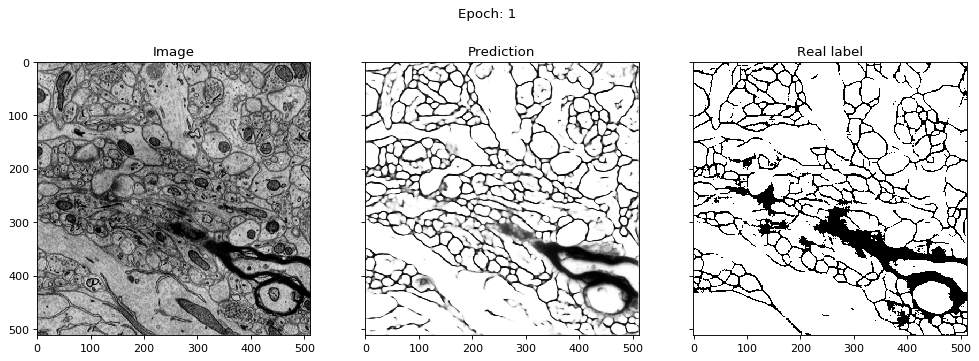

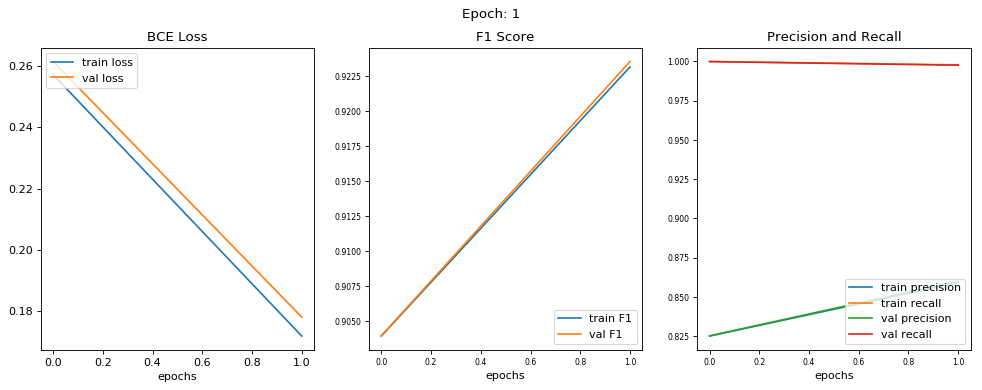

epoch [1/100] 
train loss = 0.1719, train f1 score = 0.9231 
train precision = 0.8592, train recall = 0.9978 

val loss = 0.1780, val f1 score = 0.9235 
val precision = 0.8600, val recall = 0.9975 




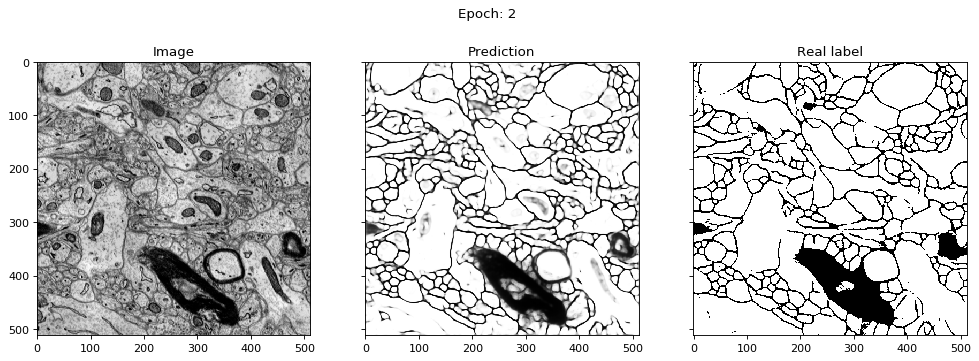

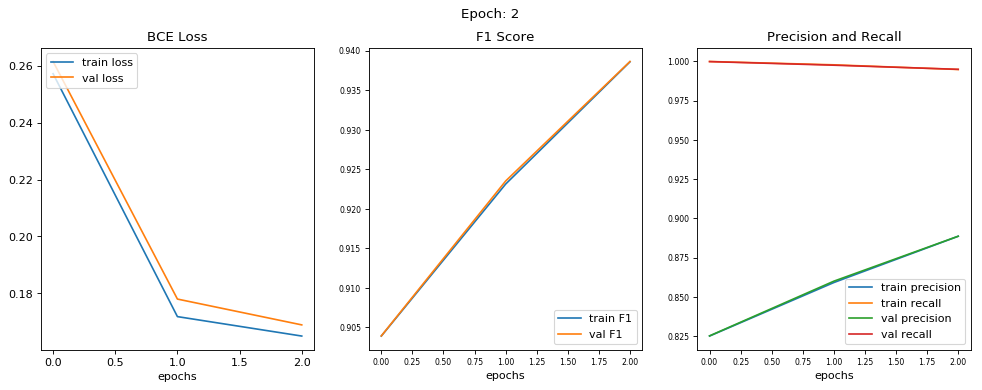

epoch [2/100] 
train loss = 0.1650, train f1 score = 0.9386 
train precision = 0.8886, train recall = 0.9948 

val loss = 0.1689, val f1 score = 0.9386 
val precision = 0.8887, val recall = 0.9949 




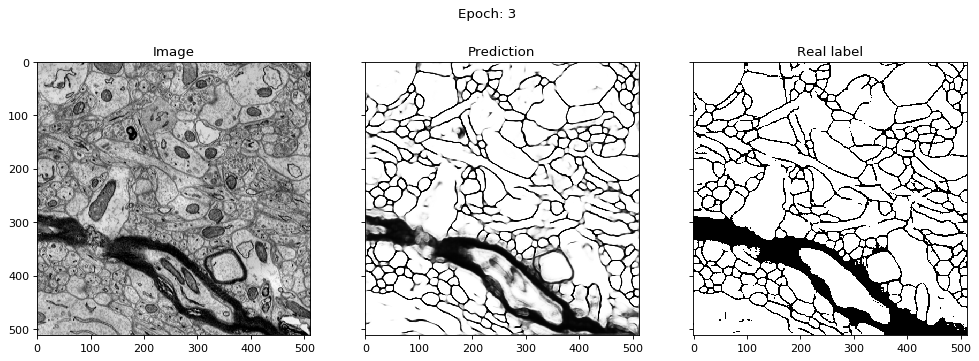

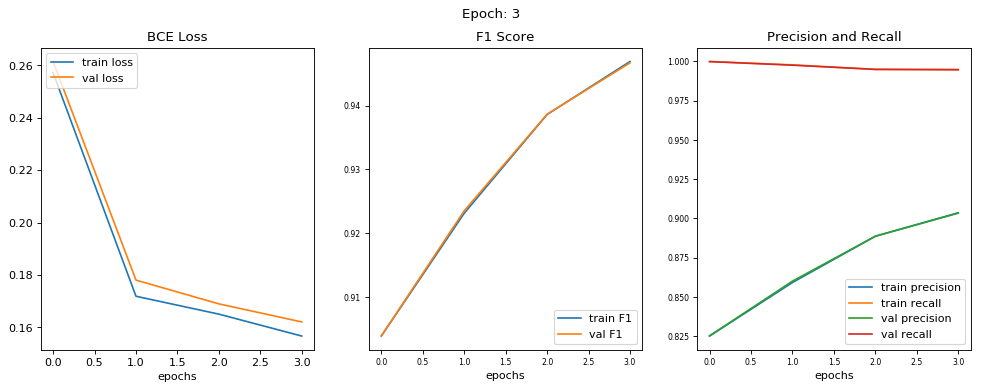

epoch [3/100] 
train loss = 0.1567, train f1 score = 0.9469 
train precision = 0.9036, train recall = 0.9948 

val loss = 0.1621, val f1 score = 0.9467 
val precision = 0.9034, val recall = 0.9946 




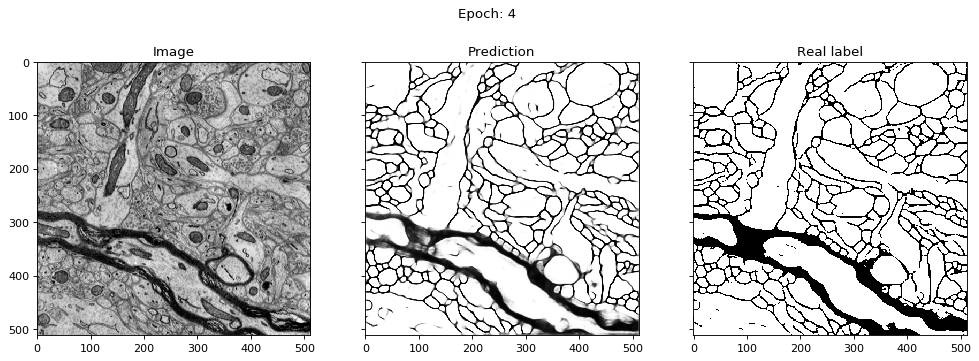

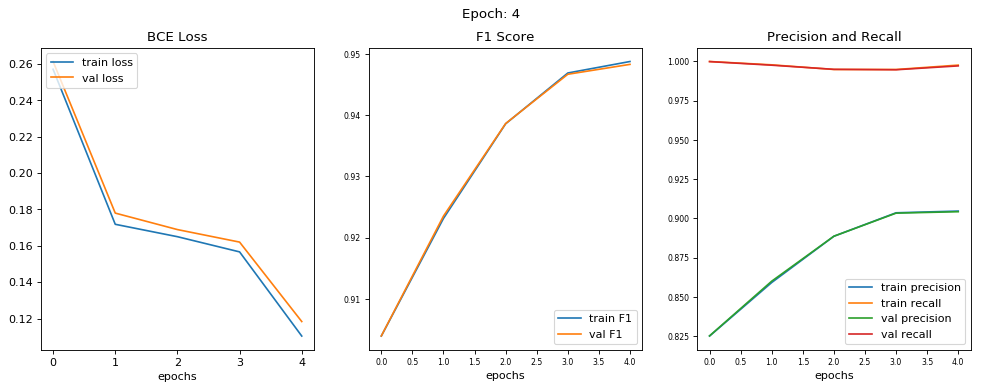

epoch [4/100] 
train loss = 0.1104, train f1 score = 0.9488 
train precision = 0.9047, train recall = 0.9976 

val loss = 0.1183, val f1 score = 0.9483 
val precision = 0.9043, val recall = 0.9971 




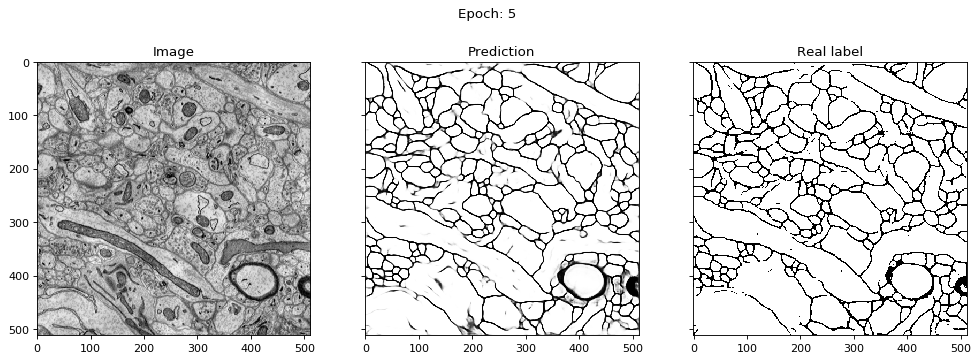

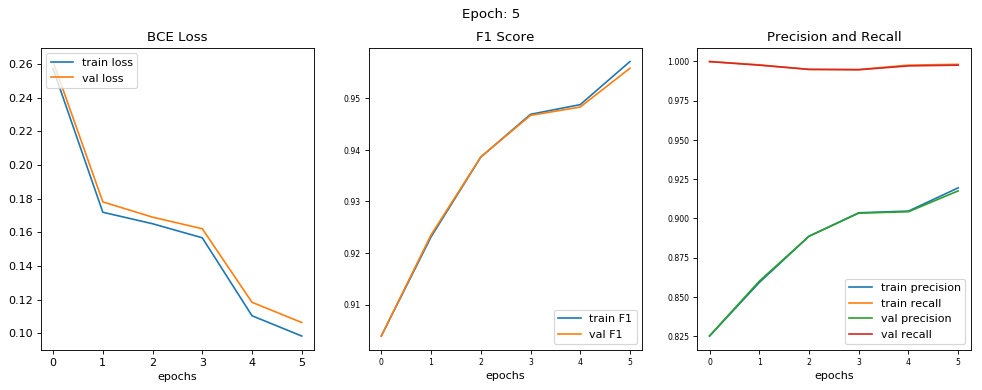

epoch [5/100] 
train loss = 0.0983, train f1 score = 0.9571 
train precision = 0.9195, train recall = 0.9981 

val loss = 0.1063, val f1 score = 0.9558 
val precision = 0.9175, val recall = 0.9976 




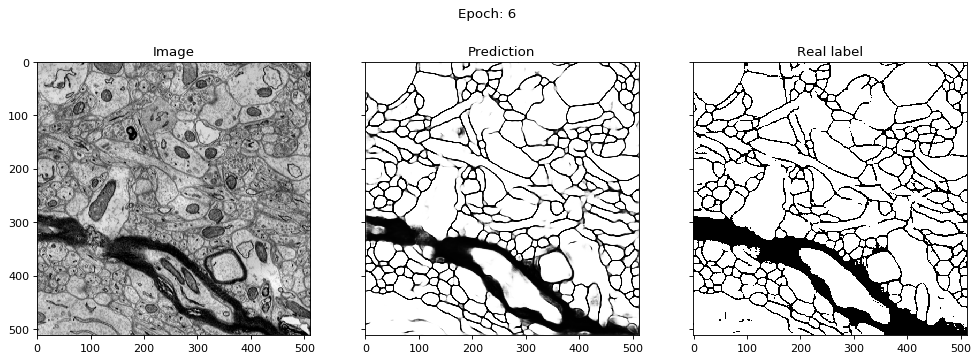

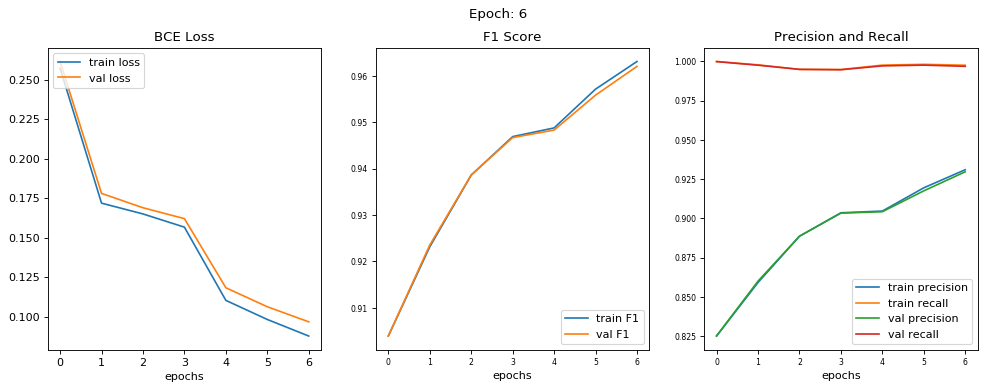

epoch [6/100] 
train loss = 0.0878, train f1 score = 0.9631 
train precision = 0.9310, train recall = 0.9975 

val loss = 0.0968, val f1 score = 0.9620 
val precision = 0.9297, val recall = 0.9968 




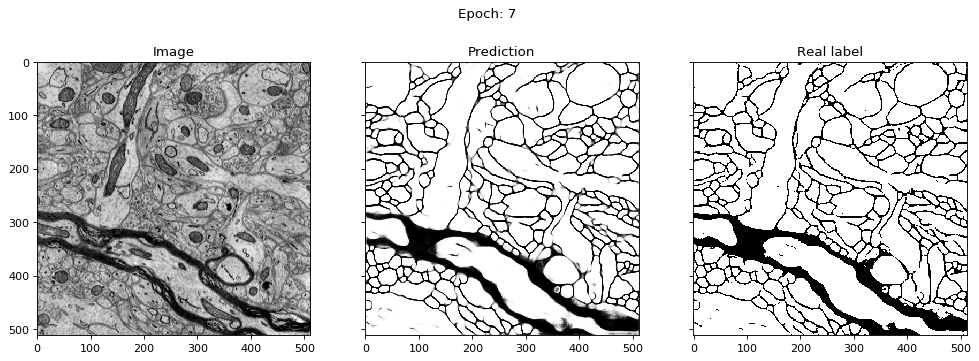

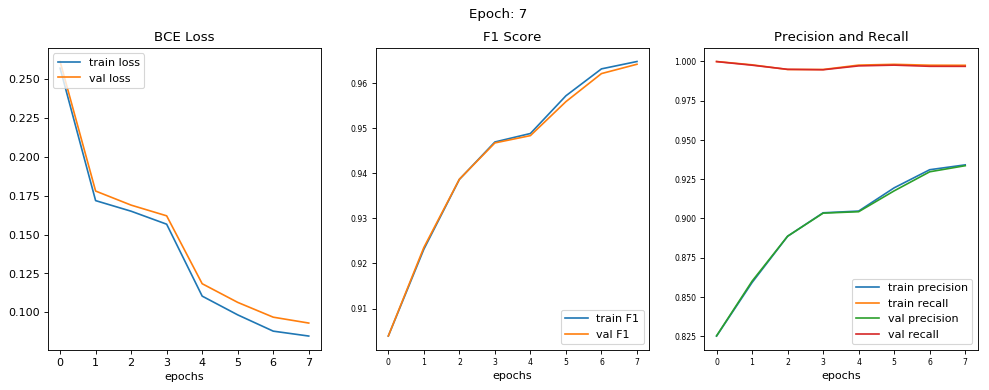

epoch [7/100] 
train loss = 0.0846, train f1 score = 0.9647 
train precision = 0.9341, train recall = 0.9975 

val loss = 0.0930, val f1 score = 0.9641 
val precision = 0.9335, val recall = 0.9968 




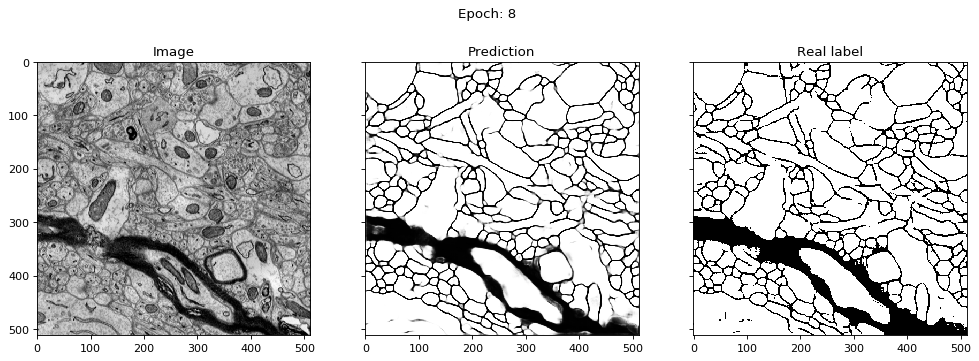

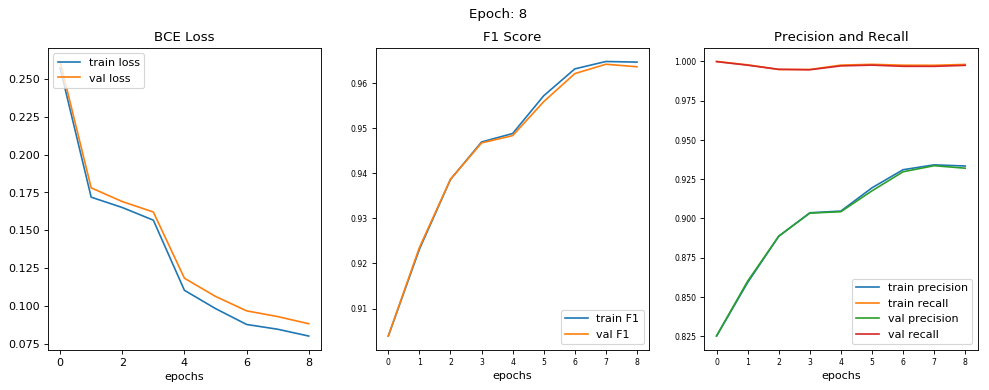

epoch [8/100] 
train loss = 0.0801, train f1 score = 0.9646 
train precision = 0.9334, train recall = 0.9980 

val loss = 0.0883, val f1 score = 0.9635 
val precision = 0.9319, val recall = 0.9974 




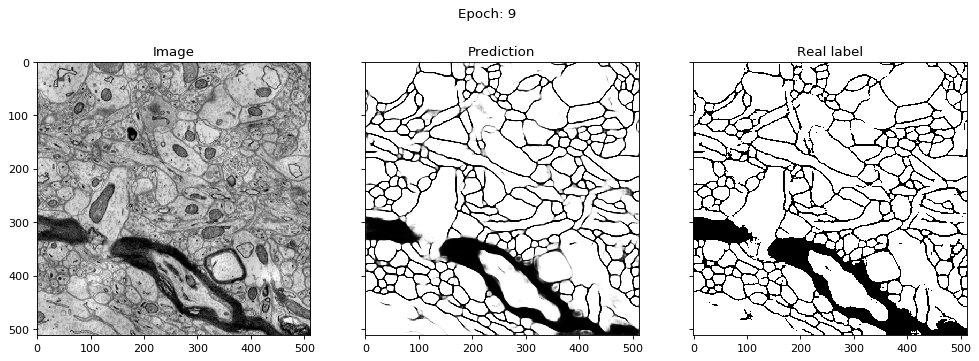

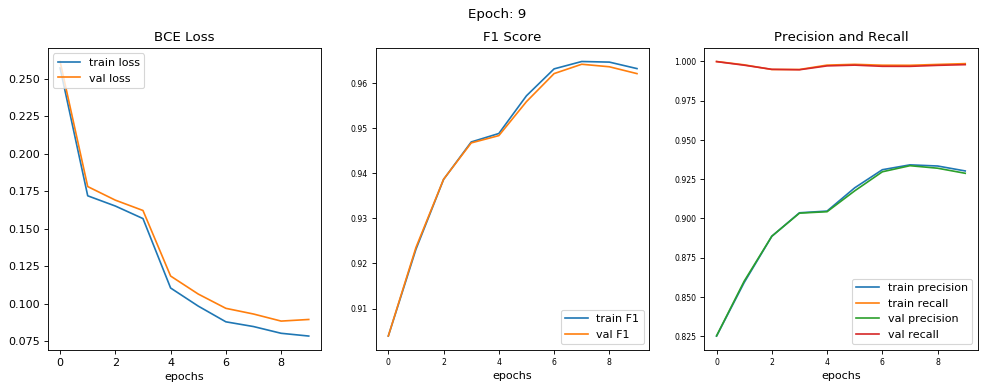

epoch [9/100] 
train loss = 0.0783, train f1 score = 0.9631 
train precision = 0.9302, train recall = 0.9985 

val loss = 0.0894, val f1 score = 0.9620 
val precision = 0.9287, val recall = 0.9979 




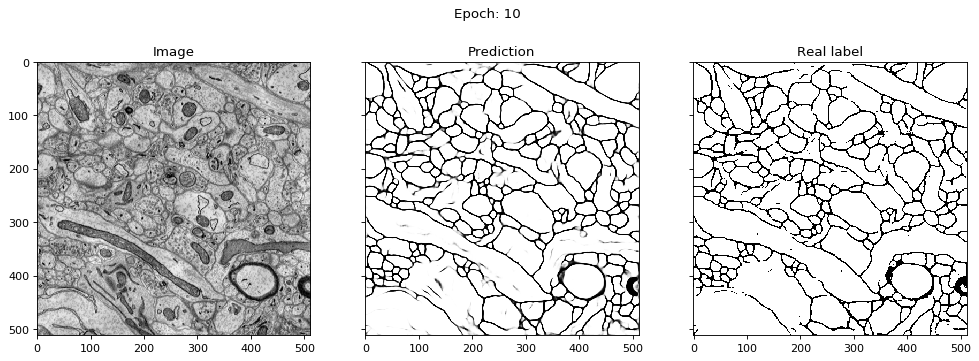

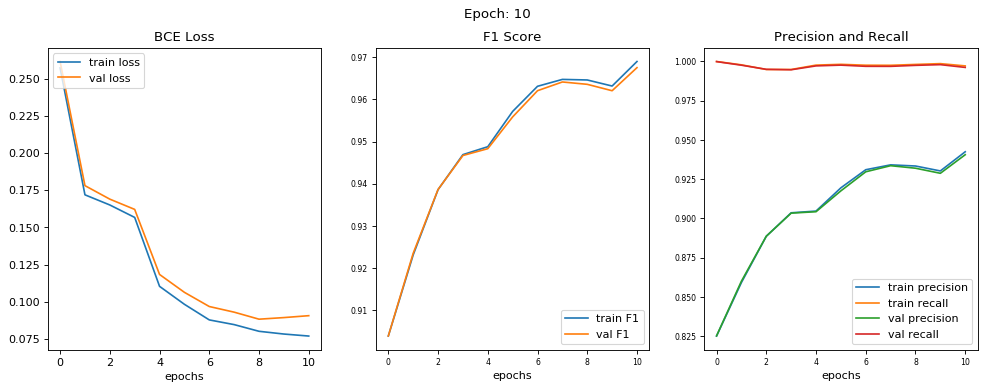

epoch [10/100] 
train loss = 0.0770, train f1 score = 0.9690 
train precision = 0.9424, train recall = 0.9971 

val loss = 0.0906, val f1 score = 0.9675 
val precision = 0.9405, val recall = 0.9961 




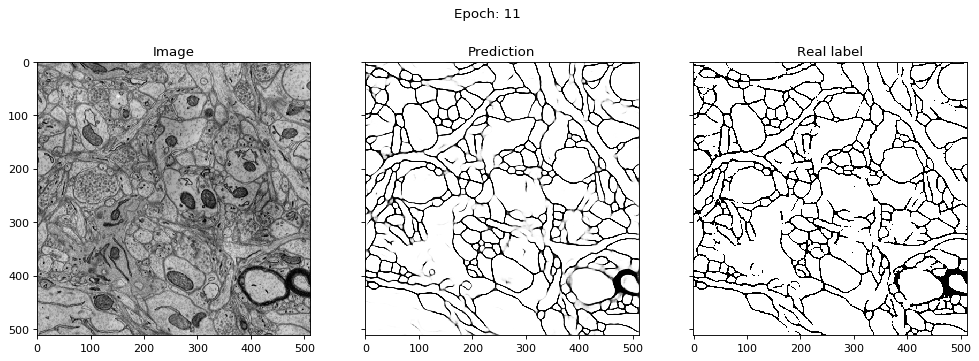

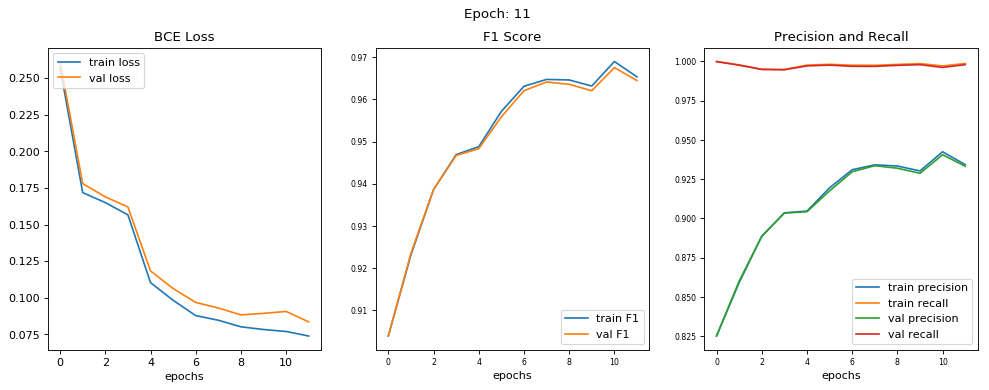

epoch [11/100] 
train loss = 0.0738, train f1 score = 0.9653 
train precision = 0.9342, train recall = 0.9986 

val loss = 0.0835, val f1 score = 0.9644 
val precision = 0.9332, val recall = 0.9979 




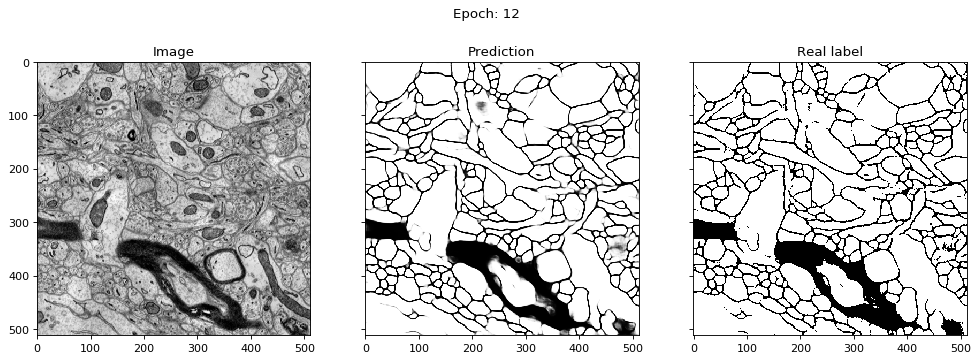

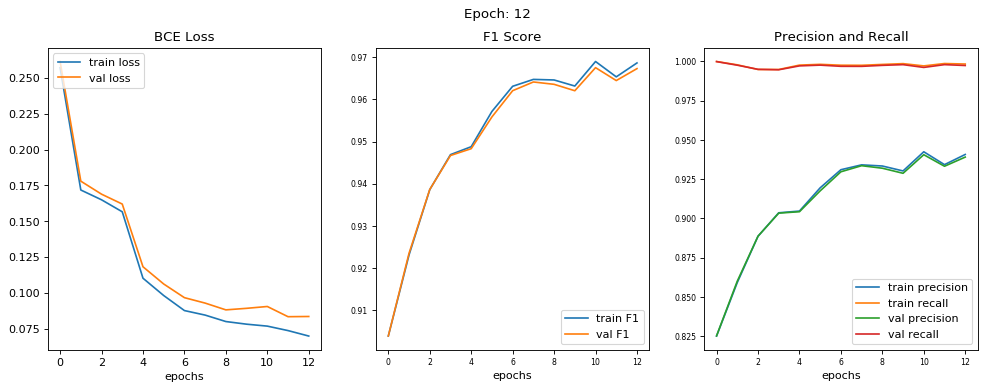

epoch [12/100] 
train loss = 0.0700, train f1 score = 0.9686 
train precision = 0.9407, train recall = 0.9983 

val loss = 0.0837, val f1 score = 0.9673 
val precision = 0.9390, val recall = 0.9973 




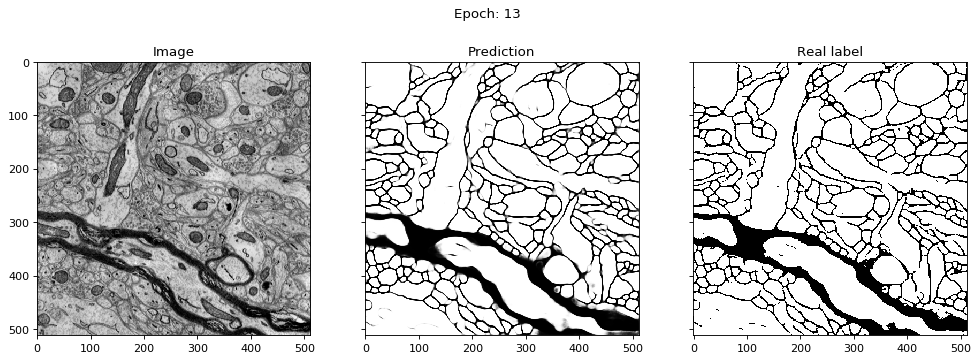

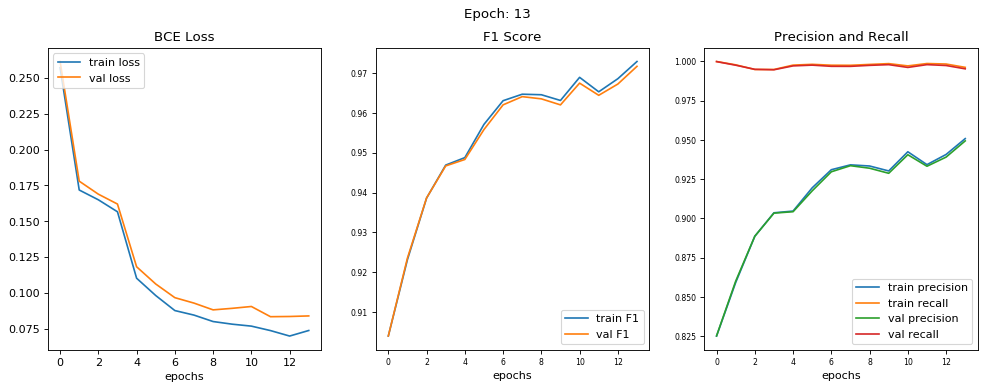

epoch [13/100] 
train loss = 0.0739, train f1 score = 0.9729 
train precision = 0.9508, train recall = 0.9962 

val loss = 0.0841, val f1 score = 0.9717 
val precision = 0.9493, val recall = 0.9952 




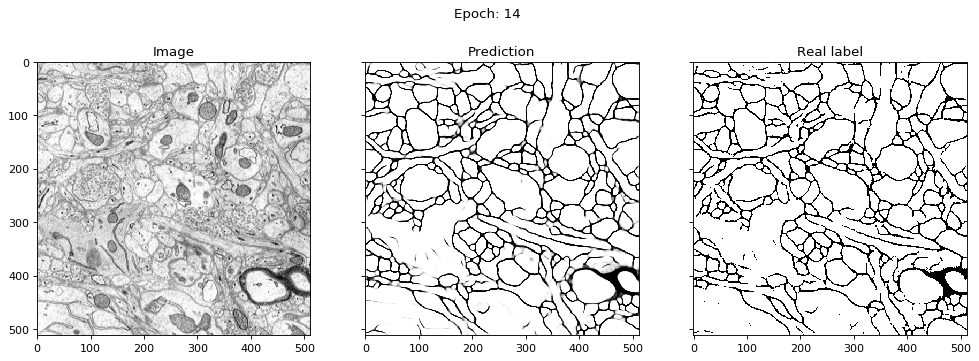

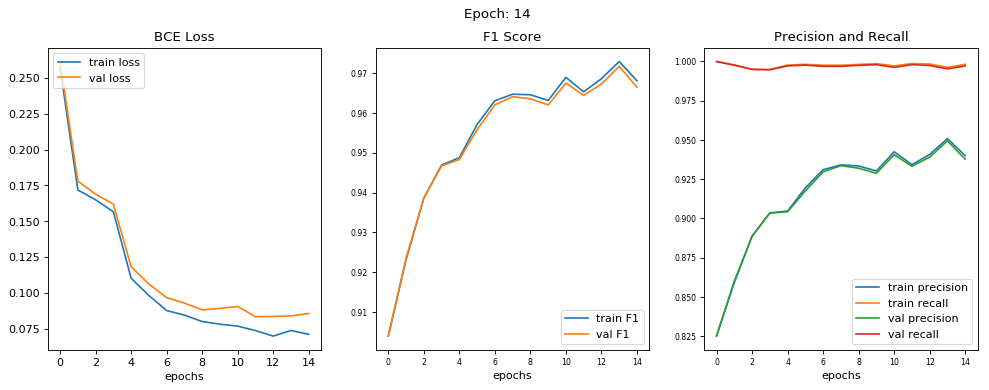

epoch [14/100] 
train loss = 0.0712, train f1 score = 0.9681 
train precision = 0.9399, train recall = 0.9981 

val loss = 0.0858, val f1 score = 0.9664 
val precision = 0.9377, val recall = 0.9971 




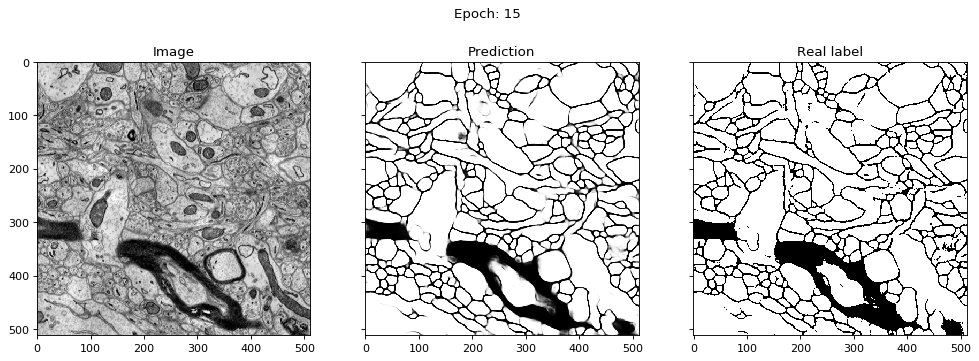

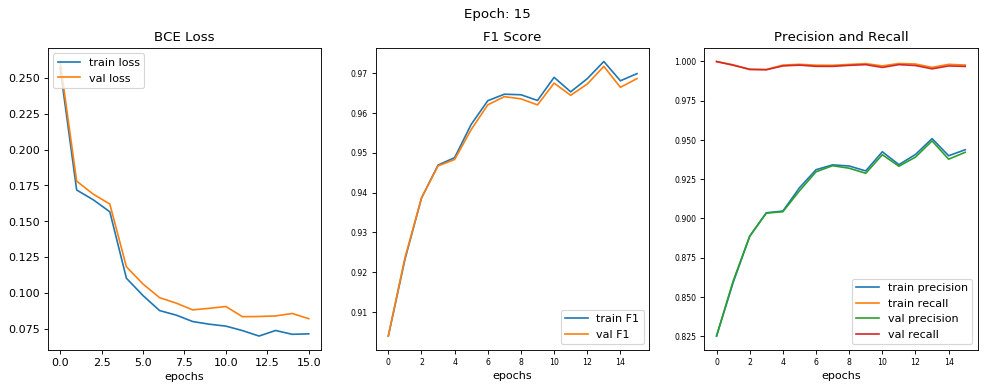

epoch [15/100] 
train loss = 0.0716, train f1 score = 0.9699 
train precision = 0.9437, train recall = 0.9976 

val loss = 0.0821, val f1 score = 0.9686 
val precision = 0.9421, val recall = 0.9968 




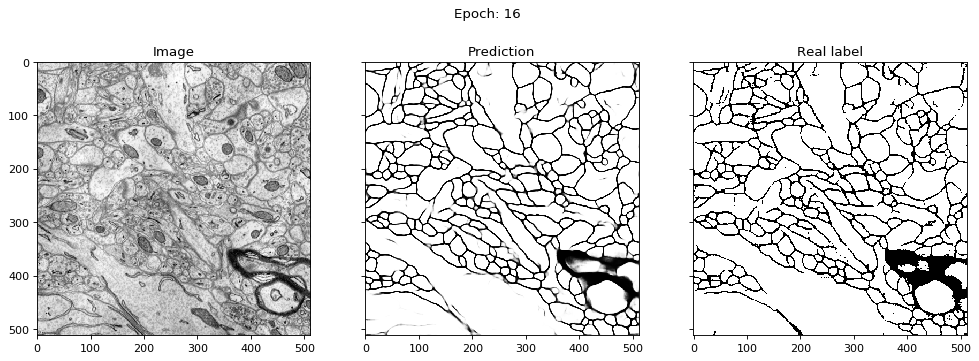

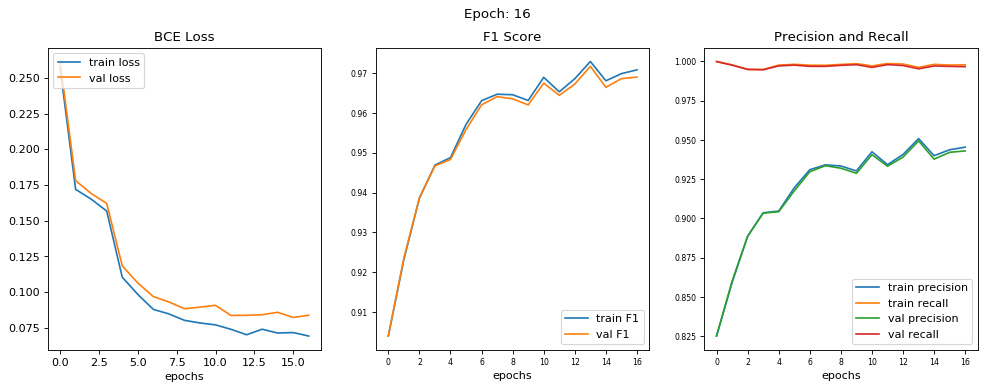

epoch [16/100] 
train loss = 0.0691, train f1 score = 0.9708 
train precision = 0.9453, train recall = 0.9978 

val loss = 0.0837, val f1 score = 0.9690 
val precision = 0.9430, val recall = 0.9966 




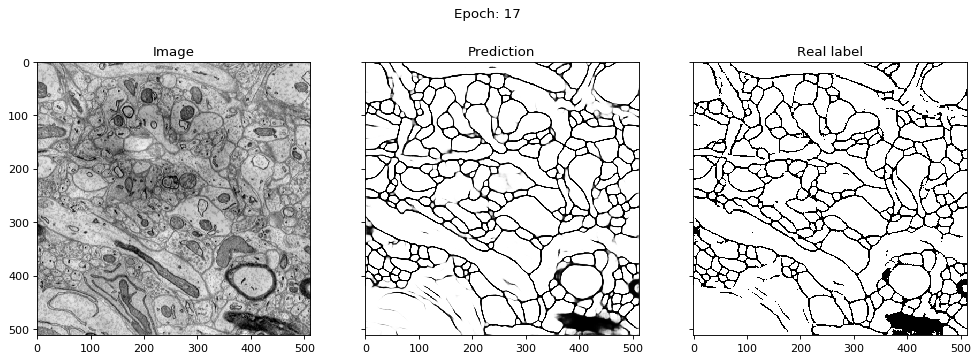

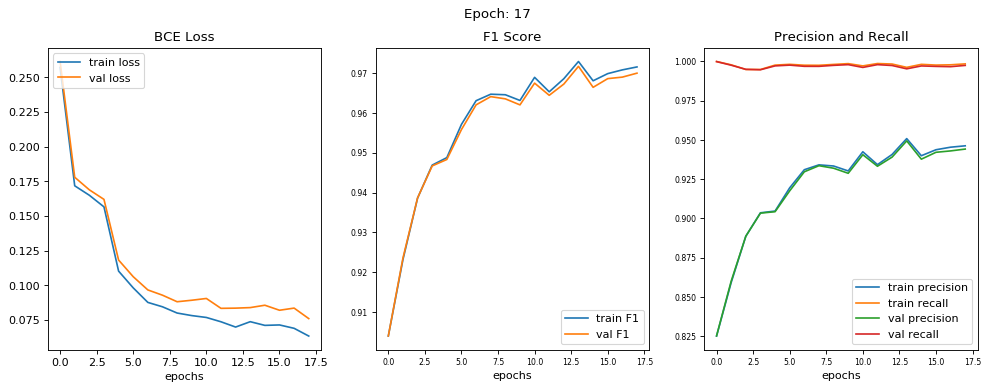

epoch [17/100] 
train loss = 0.0636, train f1 score = 0.9716 
train precision = 0.9462, train recall = 0.9984 

val loss = 0.0761, val f1 score = 0.9700 
val precision = 0.9441, val recall = 0.9974 




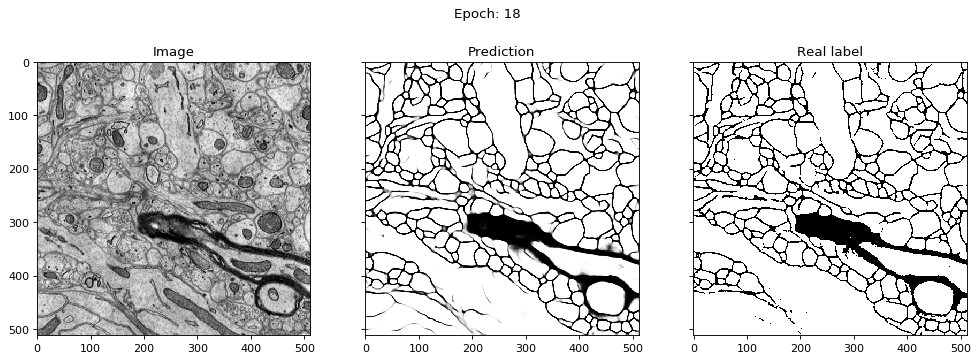

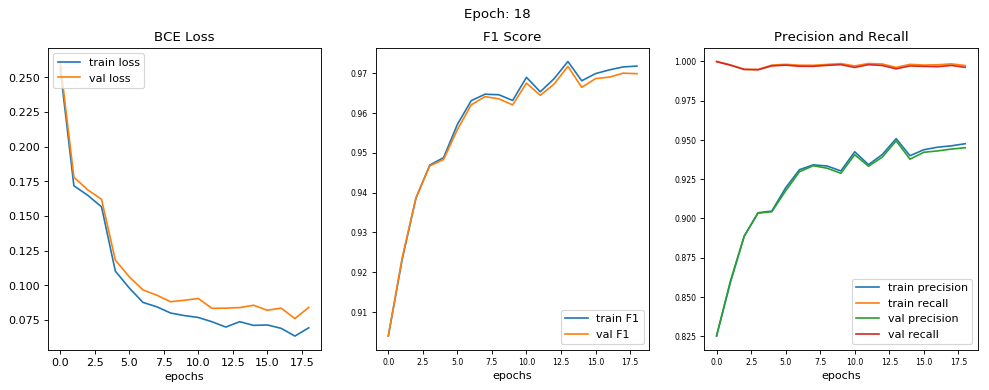

epoch [18/100] 
train loss = 0.0695, train f1 score = 0.9718 
train precision = 0.9475, train recall = 0.9973 

val loss = 0.0842, val f1 score = 0.9699 
val precision = 0.9450, val recall = 0.9962 




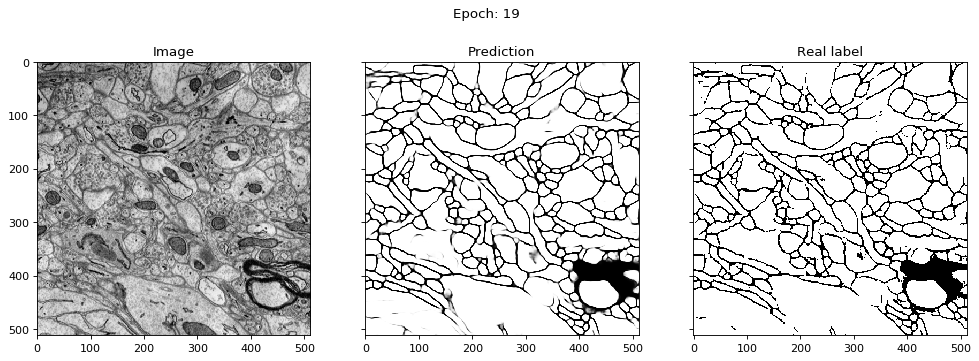

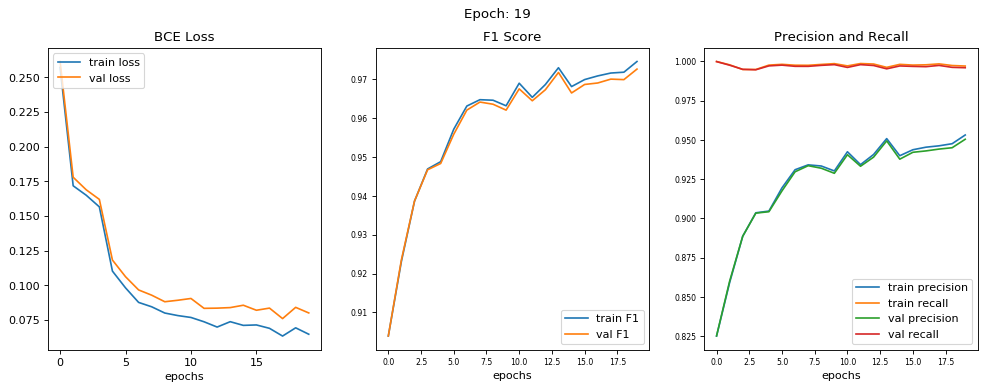

epoch [19/100] 
train loss = 0.0649, train f1 score = 0.9745 
train precision = 0.9531, train recall = 0.9970 

val loss = 0.0802, val f1 score = 0.9726 
val precision = 0.9504, val recall = 0.9959 




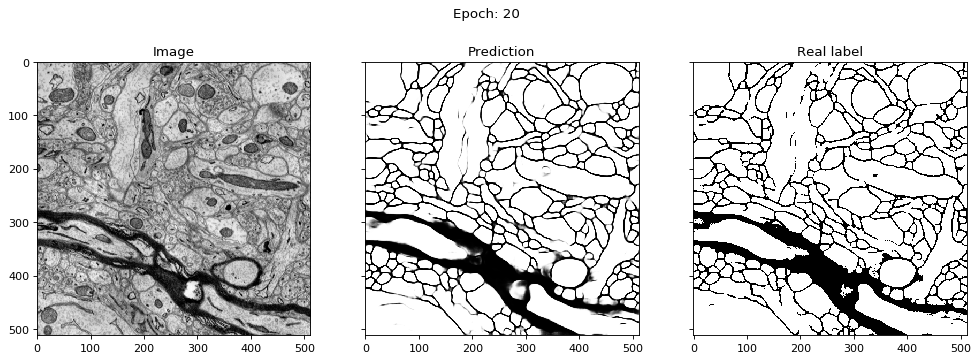

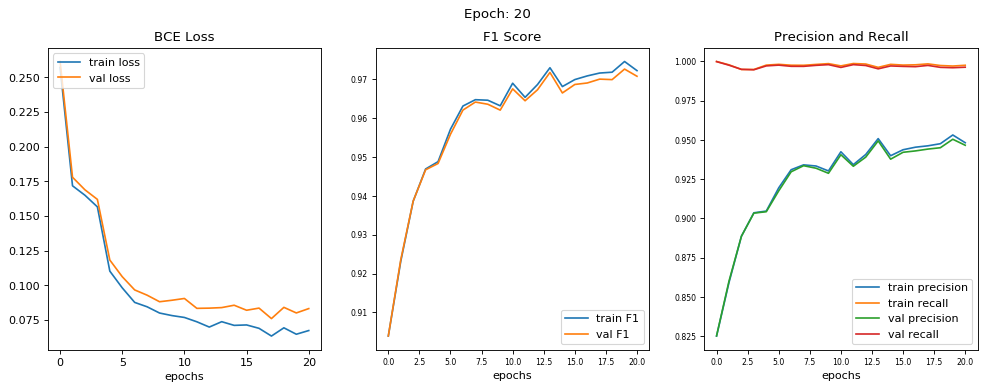

epoch [20/100] 
train loss = 0.0675, train f1 score = 0.9722 
train precision = 0.9482, train recall = 0.9975 

val loss = 0.0833, val f1 score = 0.9707 
val precision = 0.9466, val recall = 0.9962 




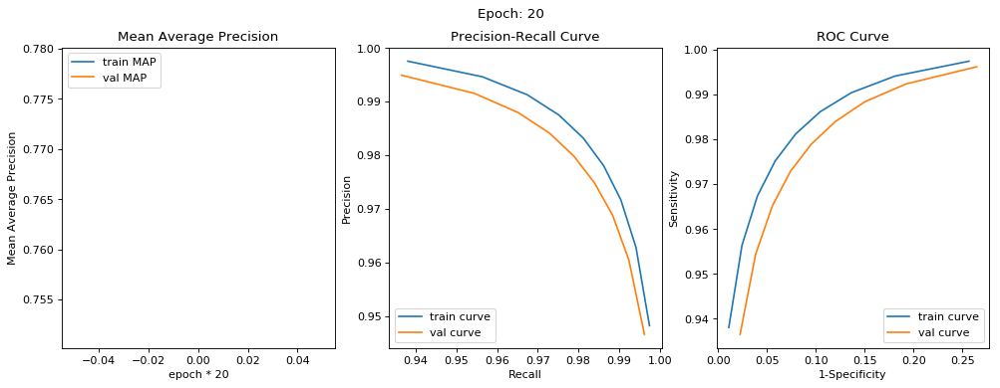

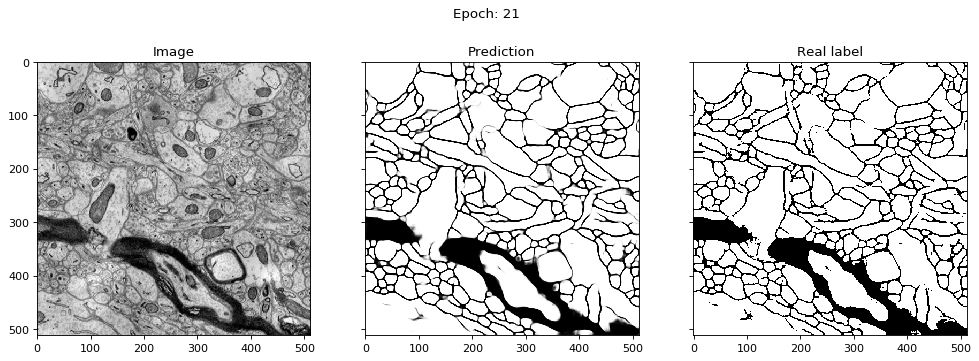

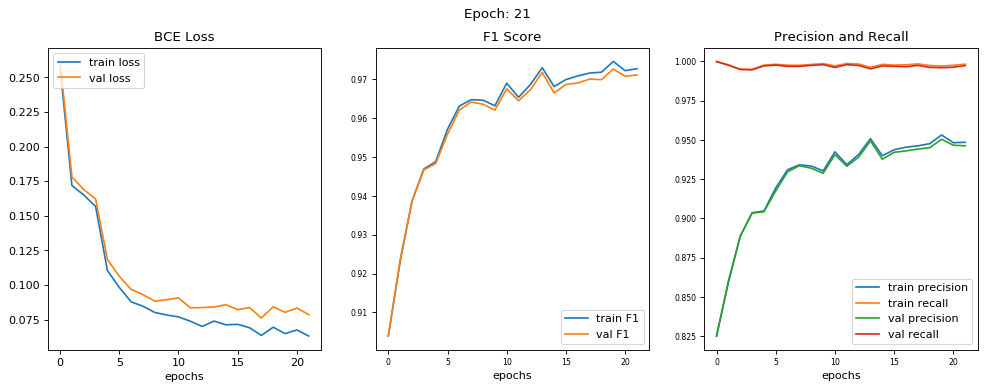

epoch [21/100] 
train loss = 0.0631, train f1 score = 0.9727 
train precision = 0.9484, train recall = 0.9982 

val loss = 0.0786, val f1 score = 0.9711 
val precision = 0.9462, val recall = 0.9973 




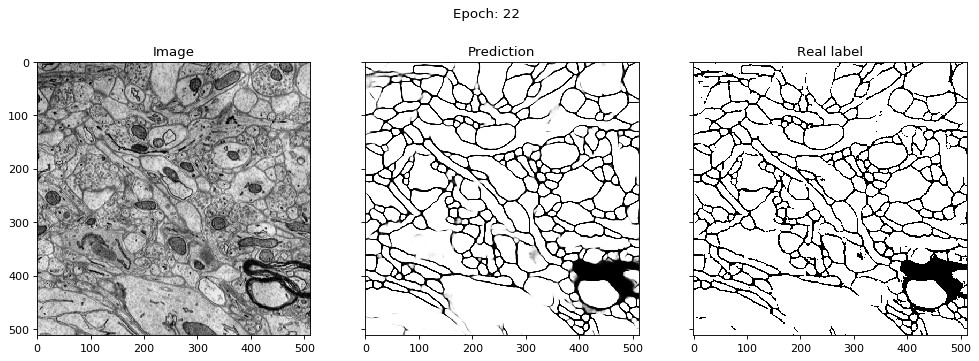

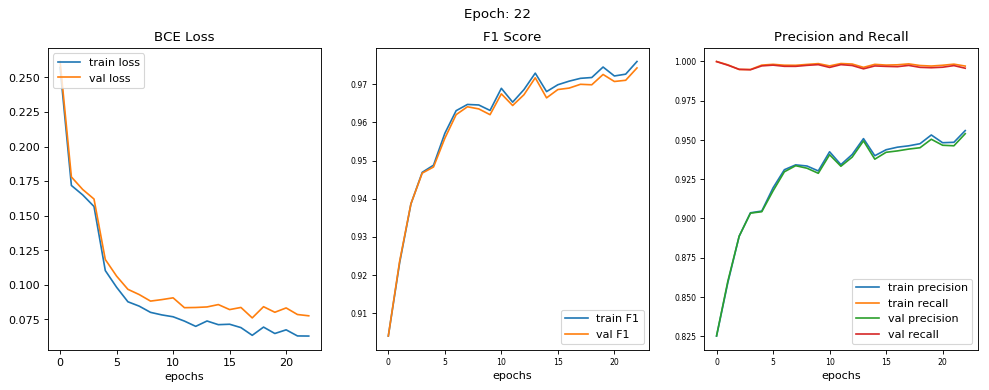

epoch [22/100] 
train loss = 0.0630, train f1 score = 0.9760 
train precision = 0.9559, train recall = 0.9970 

val loss = 0.0777, val f1 score = 0.9743 
val precision = 0.9539, val recall = 0.9956 




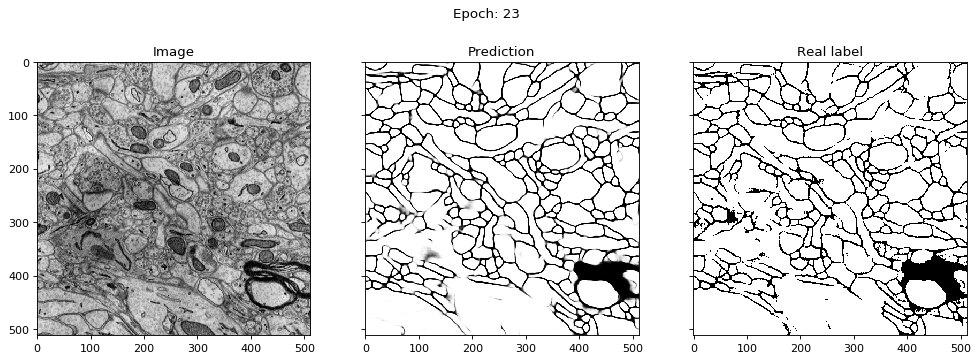

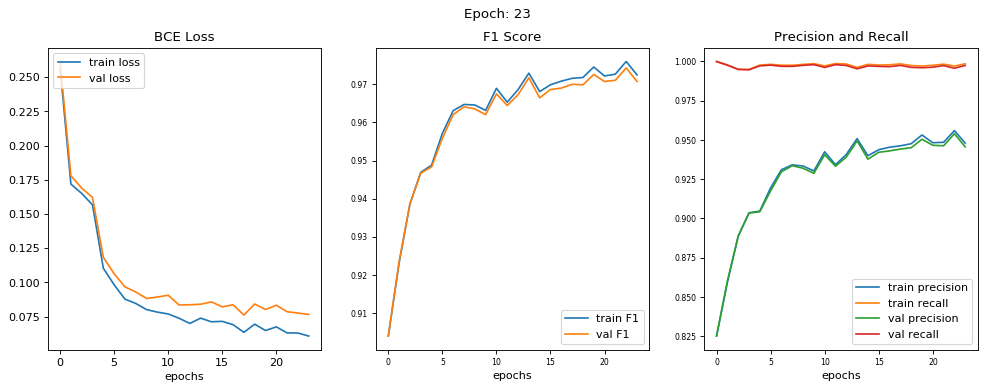

epoch [23/100] 
train loss = 0.0608, train f1 score = 0.9725 
train precision = 0.9479, train recall = 0.9984 

val loss = 0.0766, val f1 score = 0.9707 
val precision = 0.9455, val recall = 0.9974 




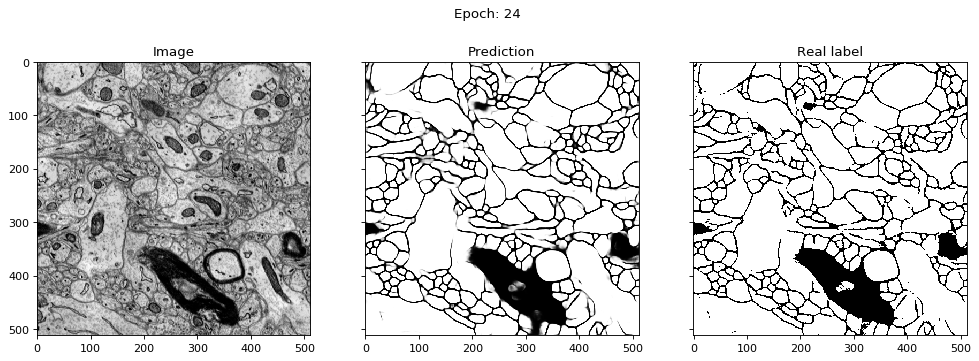

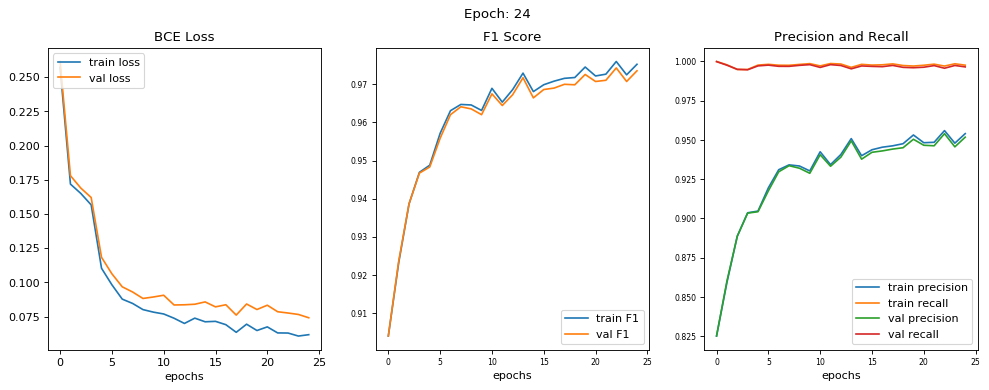

epoch [24/100] 
train loss = 0.0618, train f1 score = 0.9753 
train precision = 0.9540, train recall = 0.9975 

val loss = 0.0742, val f1 score = 0.9736 
val precision = 0.9517, val recall = 0.9964 




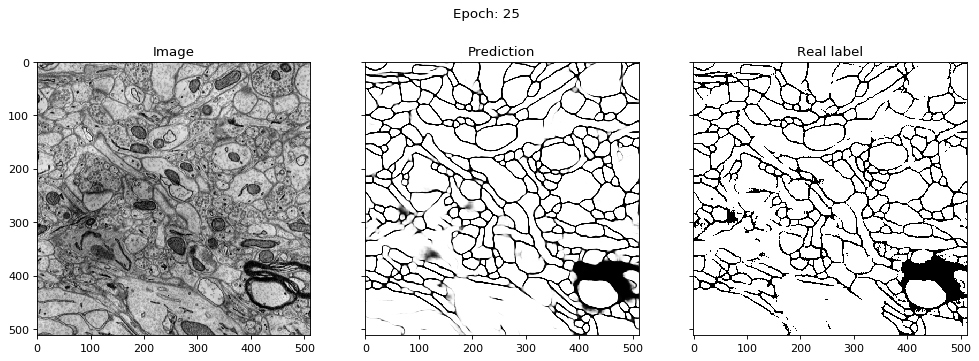

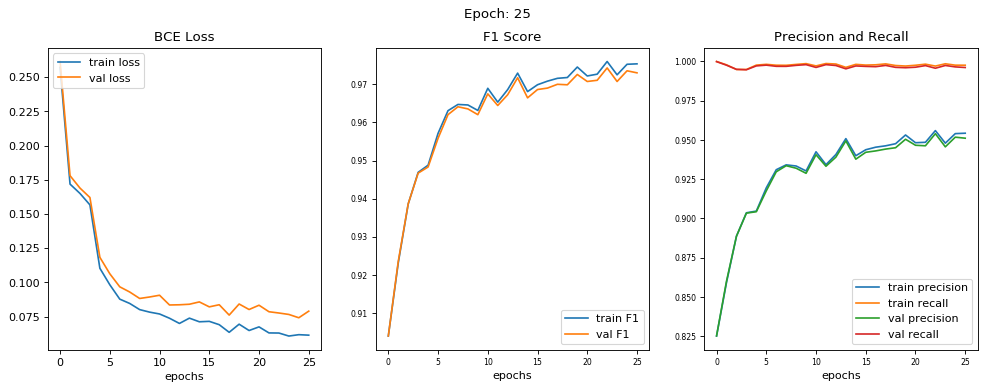

epoch [25/100] 
train loss = 0.0615, train f1 score = 0.9754 
train precision = 0.9542, train recall = 0.9975 

val loss = 0.0790, val f1 score = 0.9730 
val precision = 0.9511, val recall = 0.9961 




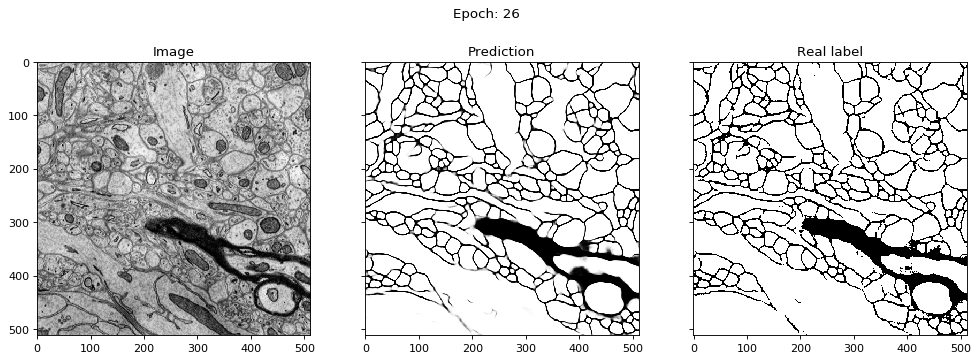

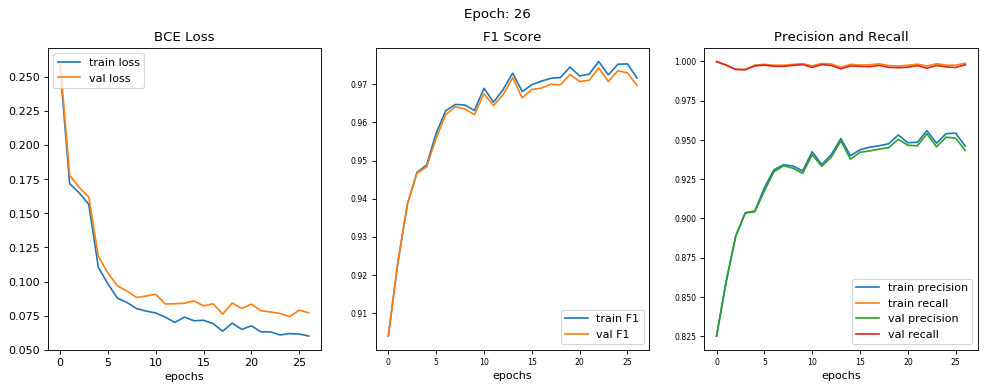

epoch [26/100] 
train loss = 0.0600, train f1 score = 0.9716 
train precision = 0.9460, train recall = 0.9987 

val loss = 0.0771, val f1 score = 0.9697 
val precision = 0.9433, val recall = 0.9978 




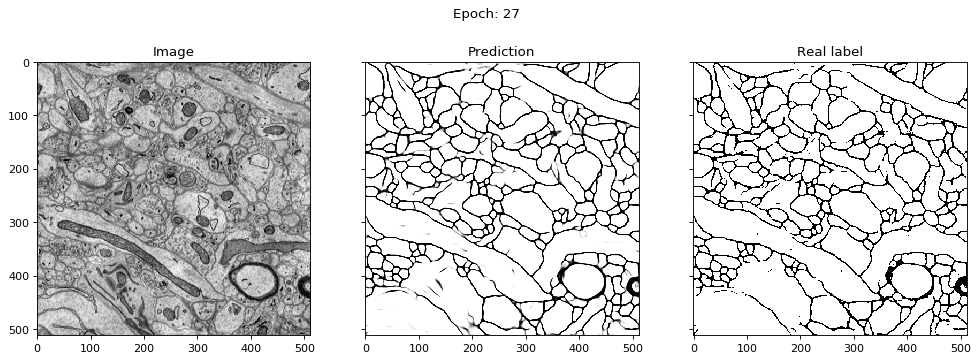

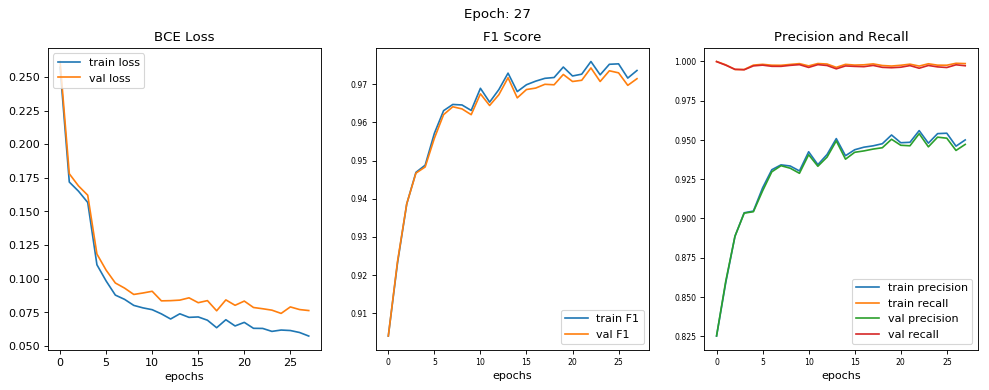

epoch [27/100] 
train loss = 0.0574, train f1 score = 0.9736 
train precision = 0.9500, train recall = 0.9985 

val loss = 0.0763, val f1 score = 0.9715 
val precision = 0.9471, val recall = 0.9972 




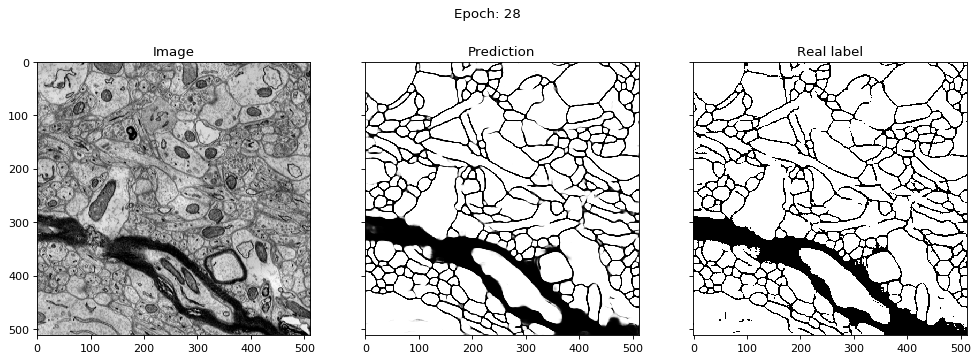

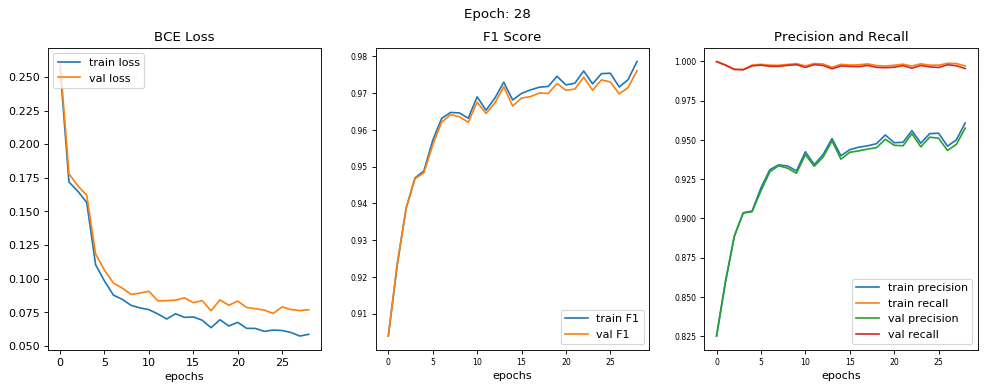

epoch [28/100] 
train loss = 0.0586, train f1 score = 0.9786 
train precision = 0.9608, train recall = 0.9970 

val loss = 0.0769, val f1 score = 0.9760 
val precision = 0.9575, val recall = 0.9954 




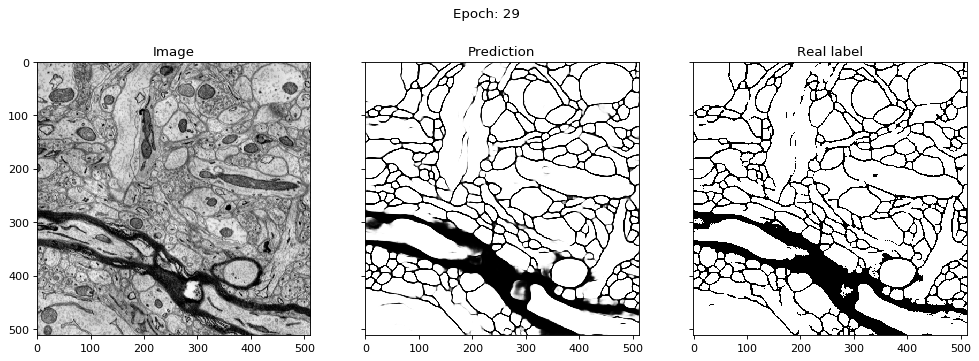

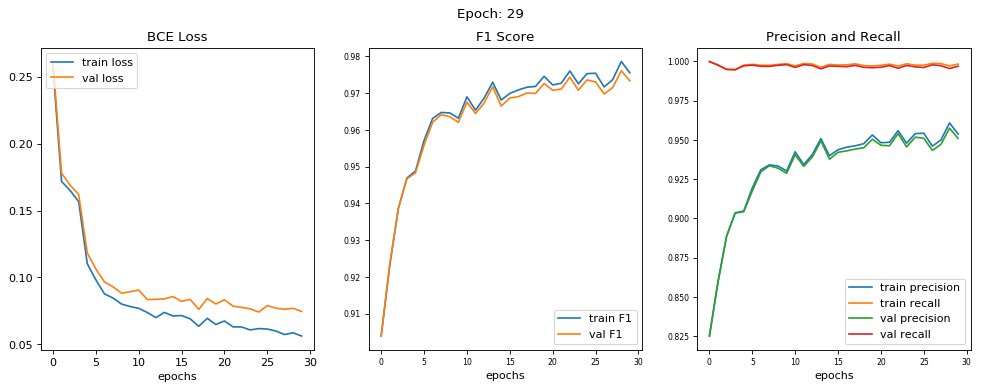

epoch [29/100] 
train loss = 0.0562, train f1 score = 0.9755 
train precision = 0.9538, train recall = 0.9982 

val loss = 0.0746, val f1 score = 0.9733 
val precision = 0.9509, val recall = 0.9969 




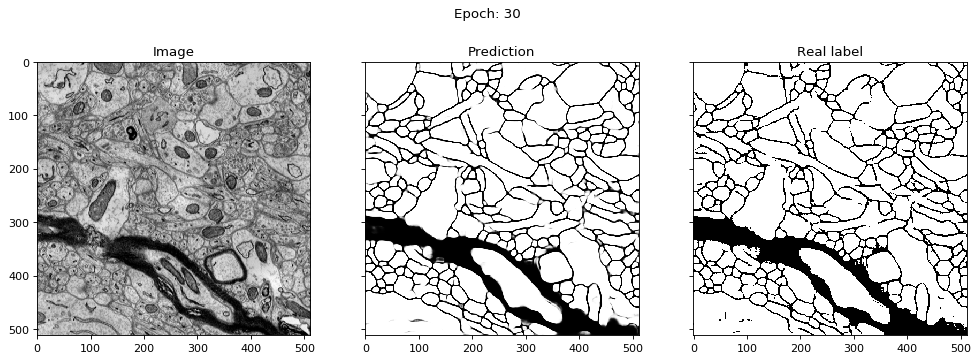

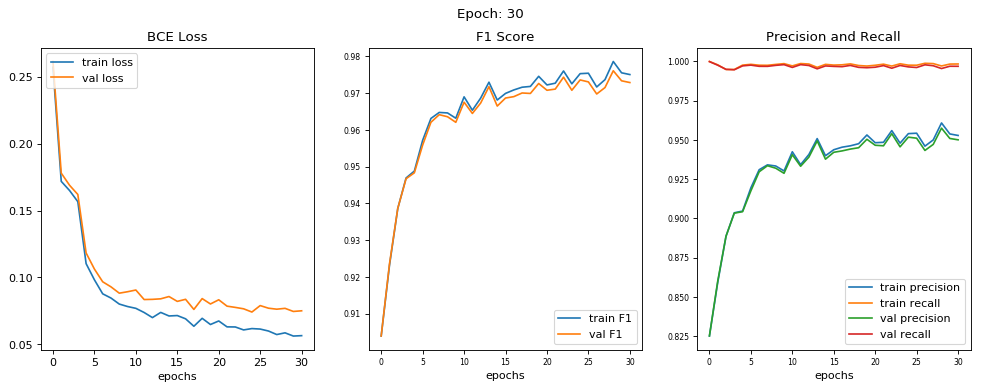

epoch [30/100] 
train loss = 0.0565, train f1 score = 0.9750 
train precision = 0.9528, train recall = 0.9983 

val loss = 0.0751, val f1 score = 0.9728 
val precision = 0.9500, val recall = 0.9968 




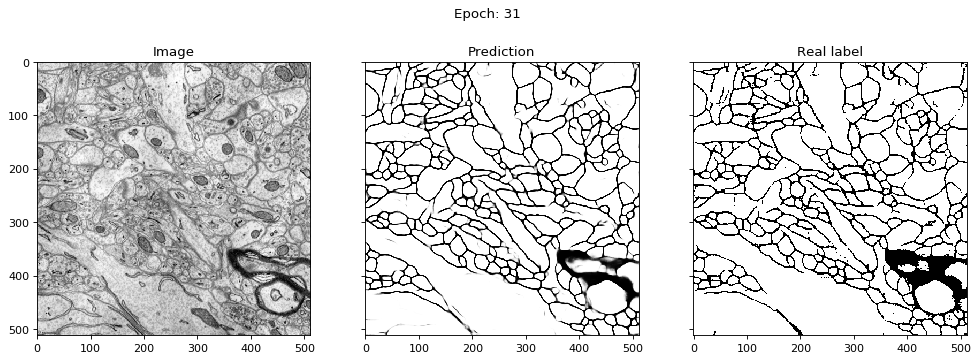

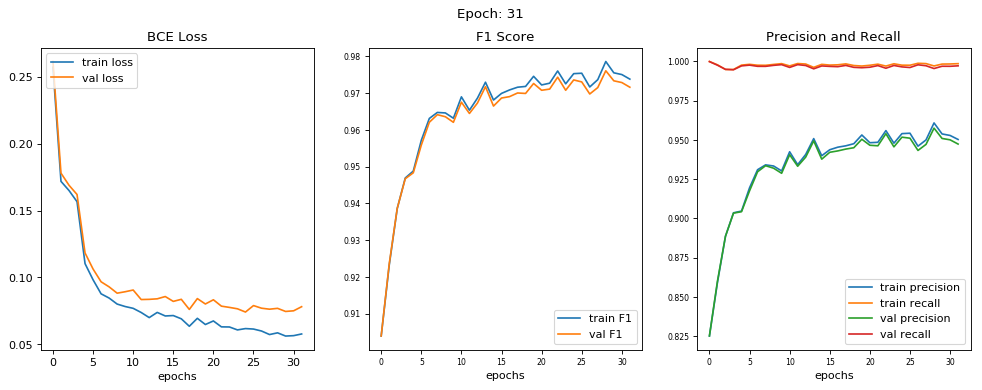

epoch [31/100] 
train loss = 0.0578, train f1 score = 0.9738 
train precision = 0.9502, train recall = 0.9985 

val loss = 0.0782, val f1 score = 0.9716 
val precision = 0.9473, val recall = 0.9971 




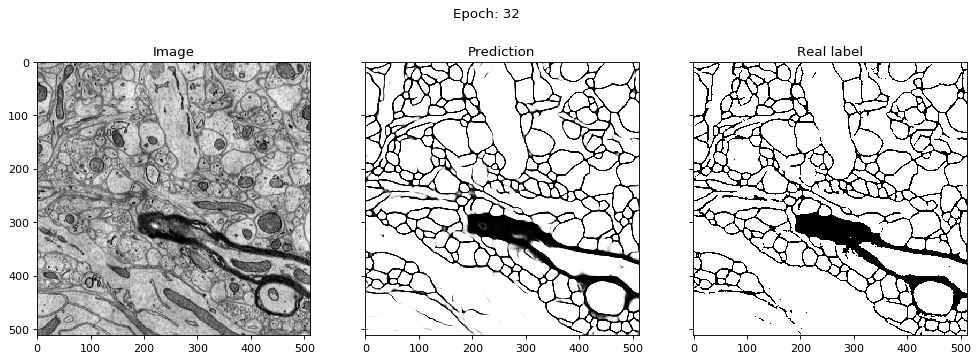

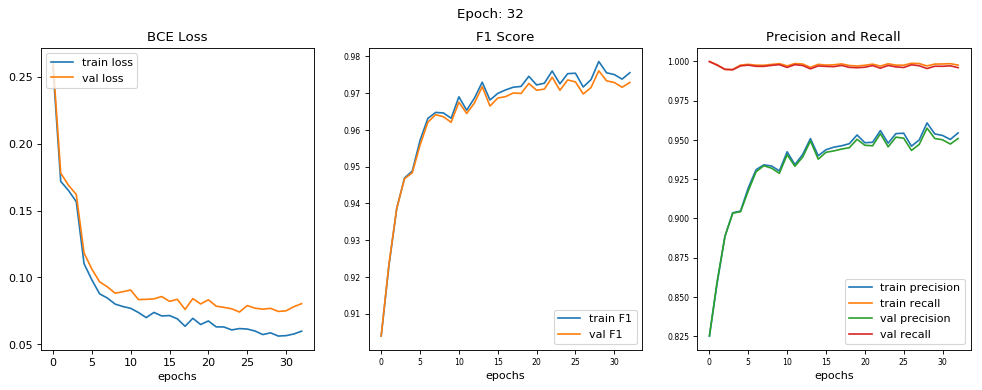

epoch [32/100] 
train loss = 0.0599, train f1 score = 0.9755 
train precision = 0.9544, train recall = 0.9976 

val loss = 0.0805, val f1 score = 0.9729 
val precision = 0.9508, val recall = 0.9960 




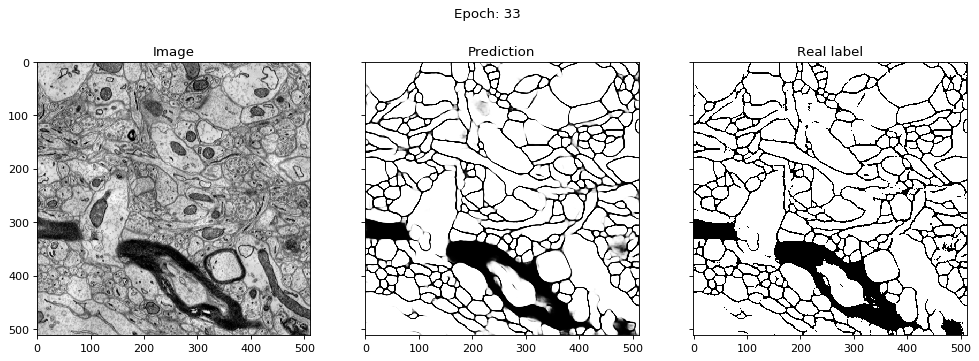

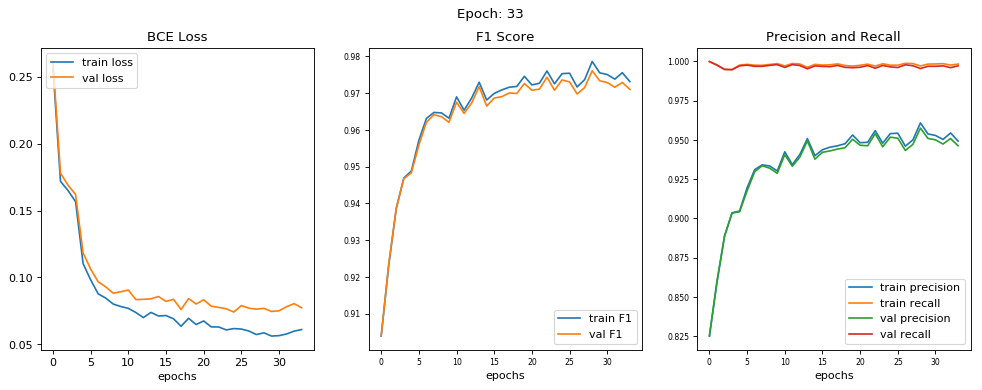

epoch [33/100] 
train loss = 0.0611, train f1 score = 0.9731 
train precision = 0.9492, train recall = 0.9983 

val loss = 0.0774, val f1 score = 0.9710 
val precision = 0.9462, val recall = 0.9971 




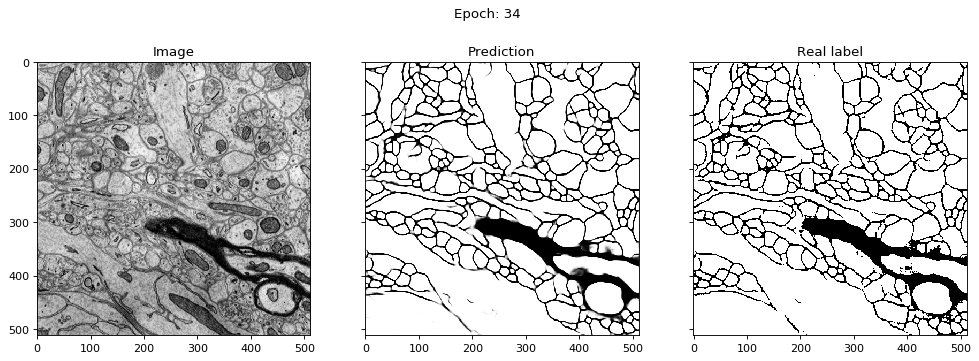

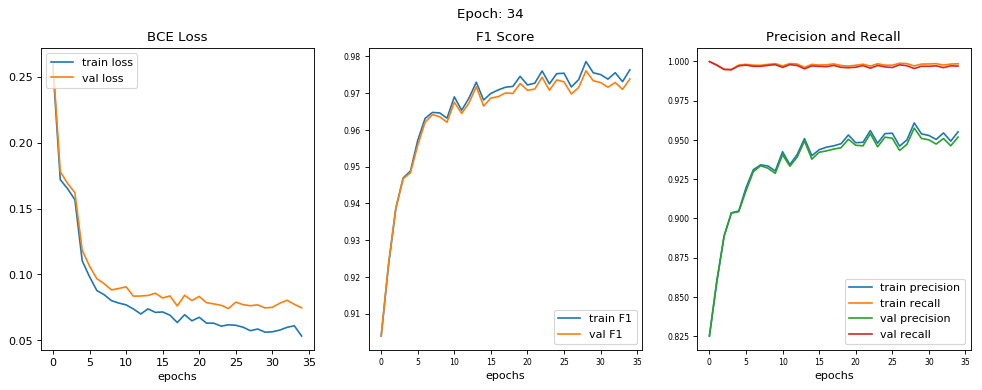

epoch [34/100] 
train loss = 0.0533, train f1 score = 0.9763 
train precision = 0.9551, train recall = 0.9984 

val loss = 0.0747, val f1 score = 0.9738 
val precision = 0.9518, val recall = 0.9970 




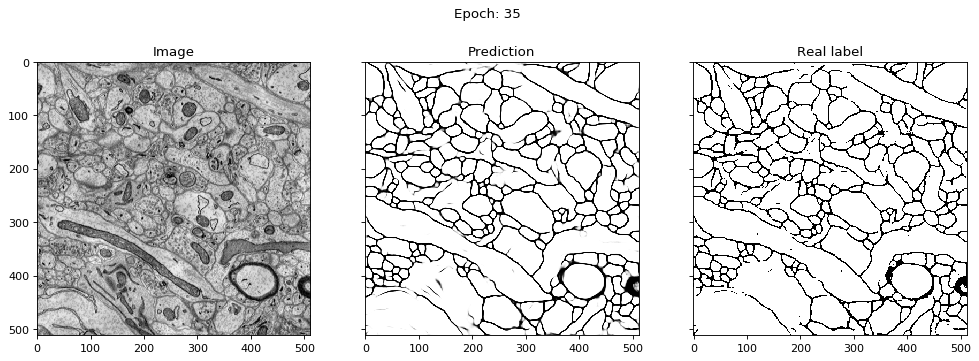

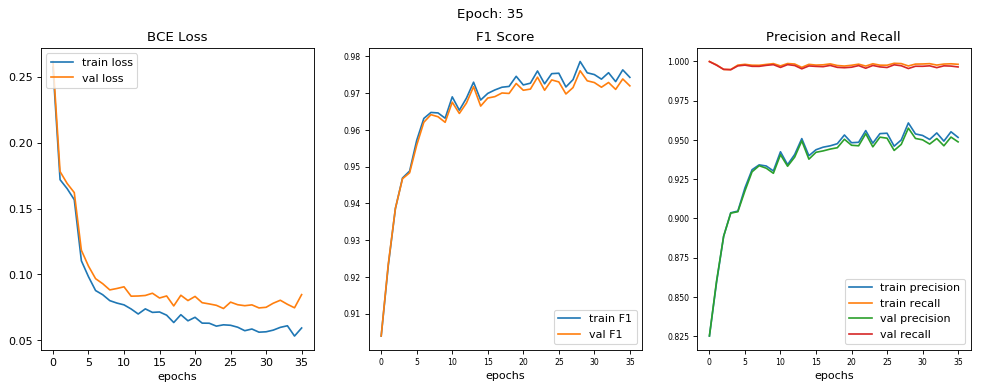

epoch [35/100] 
train loss = 0.0594, train f1 score = 0.9743 
train precision = 0.9516, train recall = 0.9981 

val loss = 0.0847, val f1 score = 0.9719 
val precision = 0.9487, val recall = 0.9964 




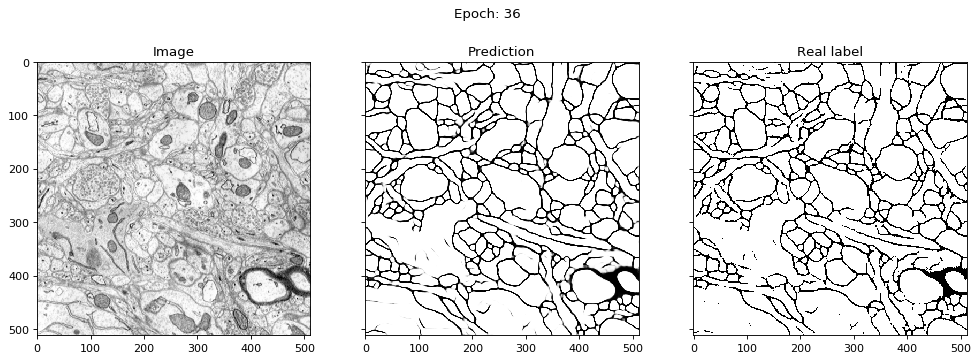

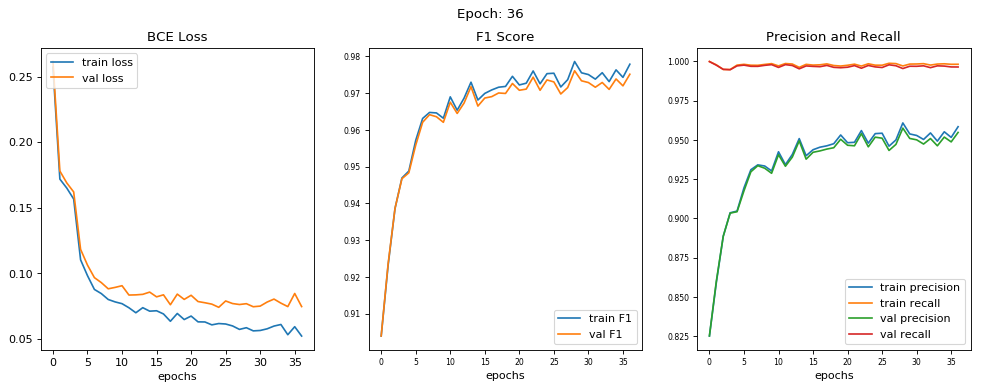

epoch [36/100] 
train loss = 0.0523, train f1 score = 0.9778 
train precision = 0.9584, train recall = 0.9981 

val loss = 0.0748, val f1 score = 0.9751 
val precision = 0.9547, val recall = 0.9964 




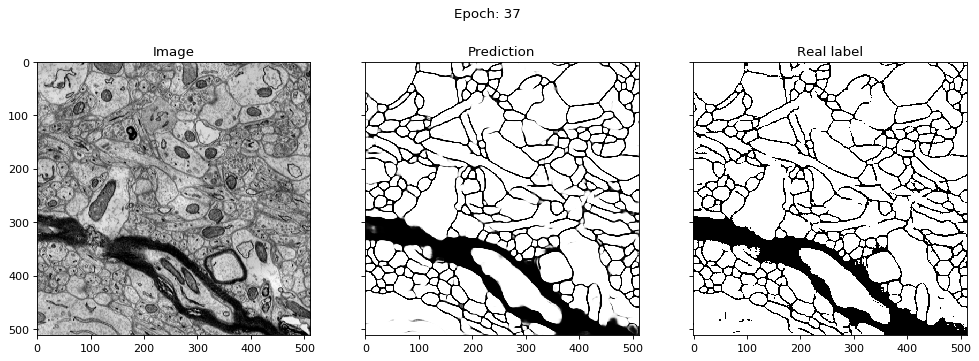

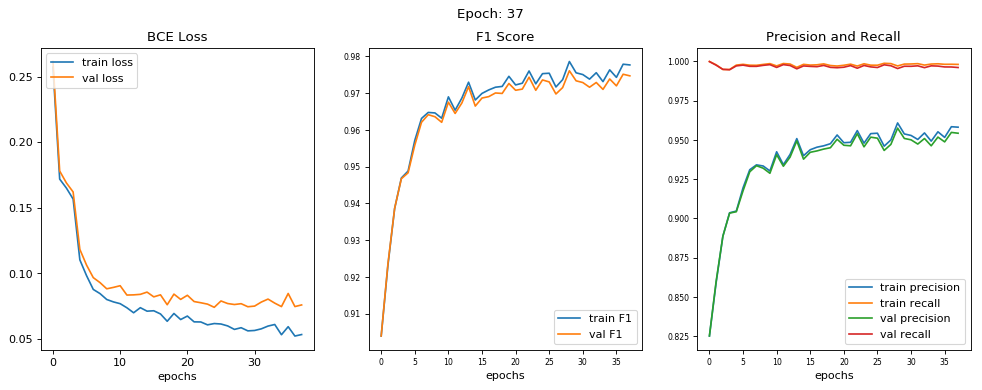

epoch [37/100] 
train loss = 0.0534, train f1 score = 0.9776 
train precision = 0.9581, train recall = 0.9980 

val loss = 0.0760, val f1 score = 0.9747 
val precision = 0.9542, val recall = 0.9960 




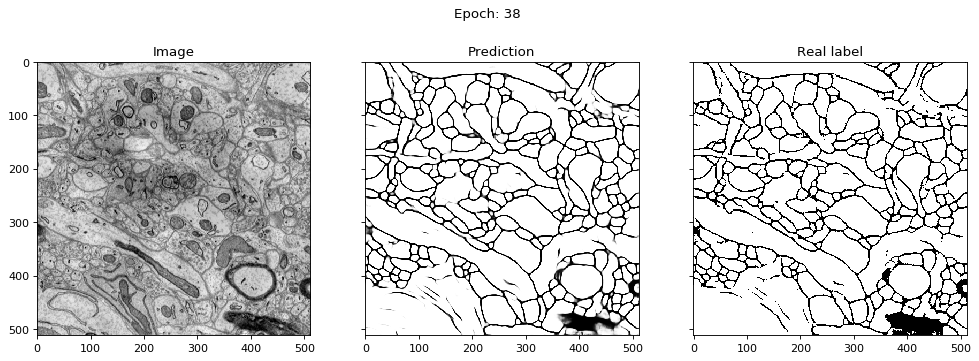

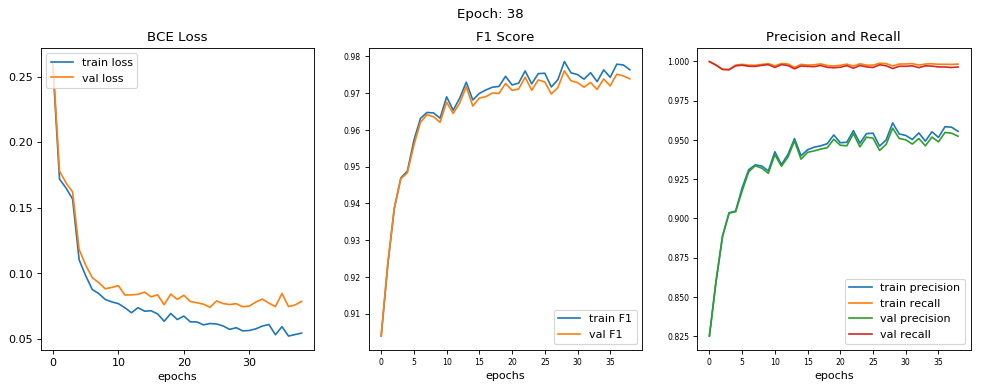

epoch [38/100] 
train loss = 0.0545, train f1 score = 0.9763 
train precision = 0.9554, train recall = 0.9982 

val loss = 0.0787, val f1 score = 0.9739 
val precision = 0.9523, val recall = 0.9964 




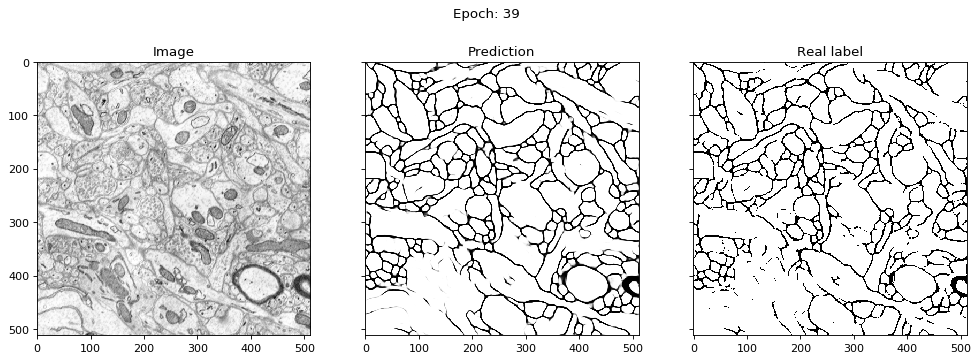

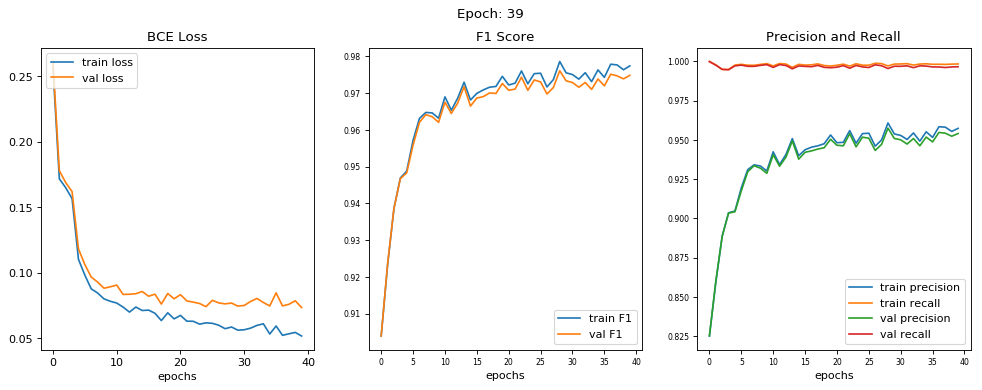

epoch [39/100] 
train loss = 0.0517, train f1 score = 0.9774 
train precision = 0.9573, train recall = 0.9983 

val loss = 0.0735, val f1 score = 0.9748 
val precision = 0.9540, val recall = 0.9965 




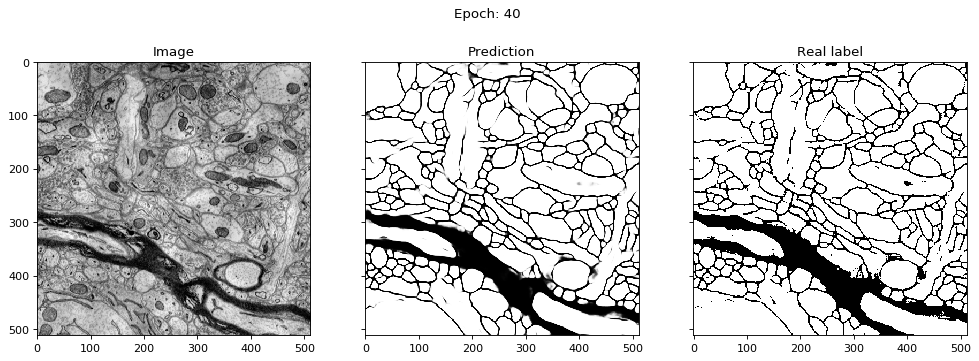

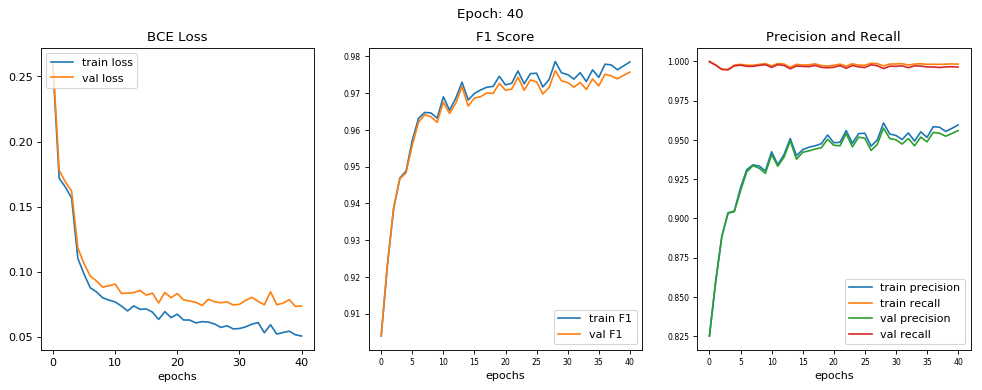

epoch [40/100] 
train loss = 0.0508, train f1 score = 0.9784 
train precision = 0.9595, train recall = 0.9982 

val loss = 0.0739, val f1 score = 0.9757 
val precision = 0.9559, val recall = 0.9963 




In [ ]:
# Prep GPU
GPU = torch.cuda.is_available()
print("GPU is {}enabled ".format(['not ', ''][GPU]))

batch_size = 1
n_epochs = 100


#unet(n_channels, n_classes, n_filters_start=64 )
un = unet(1,1)
if GPU: 
    un = un.cuda()

optimizer = torch.optim.Adam(un.parameters(), lr=0.01)
criterion = nn.BCELoss()




# split into training and validation set 
total_train_size = train_imgs.shape[0]
p = np.random.permutation(total_train_size)
train_imgs = train_imgs[p]
train_labels = train_labels[p]

val_size = int(0.2*total_train_size)

val_imgs = train_imgs[:val_size]
val_labels = train_labels[:val_size]

train_imgs = train_imgs[val_size:]
train_labels = train_labels[val_size:]

print("80/20 training/validation split")
print("total_train_size = ",total_train_size)
print("val_size = ", val_size)


# traning set

img_resize = 512
TrainDataset = Array_Dataset(train_imgs, train_labels, img_resize)
TrainDataLoader = DataLoader(TrainDataset,
                             batch_size=batch_size,
                             shuffle=True,
                             num_workers=4)

# validation set 
ValDataset = Array_Dataset(val_imgs, val_labels, img_resize, do_transform=False)
ValDataLoader = DataLoader(ValDataset,
                             batch_size=1,
                             shuffle=True,
                             num_workers=4)

for i, data in enumerate(TrainDataLoader):

        print("training image from batch %d" % i)
        
    

        imgs = np.array(data[0])
        labels = data[1]
       
        mask, nlabels = ndimage.label(labels[0])

        
        rand_cmap = ListedColormap(np.random.rand(256,3))

        labels_for_display = np.where(mask > 0, mask, np.nan)

        f, (ax1,ax2,ax3) = plt.subplots(1,3, sharey=True,figsize=(15,5), dpi=80)

        #original = (np.squeeze(imgs[0])+1)*127.0
        original = np.squeeze(imgs[0])
        

        ax1.imshow(original, cmap="gray")
        ax1.set_title("Original Image")
        ax1.axis('off')
        
        ax2.imshow(np.squeeze(labels[0]), cmap="gray")
        ax2.set_title("Ground Truth Mask")
        ax2.axis('off')
        
        ax3.imshow(original, cmap="gray")
        ax3.imshow(np.squeeze(labels_for_display), cmap=rand_cmap)
        ax3.set_title("Instance Segmentation (%d structures)"% nlabels)
        ax3.axis('off')
        

        plt.show()
        
        if i > 1: 
            break



output_dir = "./isbi2013_output/"
# run training 
#training(GPU, un,train_imgs, train_labels, val_imgs, val_labels, optimizer, criterion, n_epochs, batch_size)
training(GPU, TrainDataLoader, ValDataLoader, ValDataset, un, optimizer, criterion, n_epochs, batch_size, output_dir, warm_start=False)




In [ ]:

print(count_parameters(model))